In [1]:
import numpy as np
import networkx as nx
from plotly import graph_objects as go
from plotly import express as px

In [2]:
import plotly.io as pio
dpi = 600
format = ".tif"
width = 2.0
height = 1.0
scale = 6
text_color = "black"

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
cd drive

/content/drive


In [5]:
cd MyDrive

/content/drive/MyDrive


In [6]:
cd XBBvariants

/content/drive/MyDrive/XBBvariants


In [7]:
import os
cwd = os.getcwd() + os.sep
cwd

'/content/drive/MyDrive/XBBvariants/'

In [8]:
map_centralities_dict_names = {
                                cwd+"Data/BC/Txt/": "betweenness_c",
                                cwd+"Data/EC/Txt/": "eigenvector_c",
                                #cwd+"Data/KC/Txt/": "katz_c",
                                cwd+"Data/DC/Txt/": "degree_c",
                                cwd+"Data/CC/Txt/": "closeness_c"
                                }

In [9]:
spike_muts_variants = {
                        "XBB.1": np.array([19, 24, 83, 142, 146, 183, 213, 252, 339, 346, 368, 371, 373, 375, 376, 405, 408, 417, 440, 445, 446,
                                              460, 477, 478, 484, 490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
                        "XBB.1.9.1": np.array([19, 24, 83, 142, 146, 183, 213, 252, 339, 346, 368, 371, 373, 375, 376, 405, 408, 417, 440, 445, 446,
                                              460, 477, 478, 484, 486, 490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
                       "XBB.2.3": np.array([19, 24, 83, 142, 146, 183, 213, 253, 339, 346, 368, 371, 373, 375, 376, 405, 408, 417, 440, 445, 446,
                                              460, 477, 478, 484, 486, 490, 498, 501, 505, 521, 614, 655, 679, 681, 764, 796, 954, 969]),
                       "XBB.1.5": np.array([19, 24, 83, 142, 146, 183, 213, 252, 339, 346, 368, 371, 373, 375, 376, 405, 408, 417, 440, 445, 446,
                                              460, 477, 478, 484, 486, 490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
                       "XBB.1.16": np.array([19, 24, 83, 142, 146, 180, 183, 213, 252, 339, 346, 368, 371, 373, 375, 376, 405, 408, 417, 440, 445, 446,
                                              460, 477, 478, 484, 486, 490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
                       "EG.5.1": np.array([19, 24, 52, 83, 142, 146, 180, 183, 213, 252, 339, 346, 368, 371, 373, 375, 376, 405, 408, 417, 440, 445, 446,
                                            456, 460, 477, 478, 484, 486, 490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969])
                      }
centralities_supported = [cwd+"Data/EC/Txt/", cwd+"Data/DC/Txt/", cwd+"Data/CC/Txt/", cwd+"Data/BC/Txt/"]#,  #cwd+"Data/KC/Txt/"]

In [10]:
spike_muts_variants

{'XBB.1': array([ 19,  24,  83, 142, 146, 183, 213, 252, 339, 346, 368, 371, 373,
        375, 376, 405, 408, 417, 440, 445, 446, 460, 477, 478, 484, 490,
        498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
 'XBB.1.9.1': array([ 19,  24,  83, 142, 146, 183, 213, 252, 339, 346, 368, 371, 373,
        375, 376, 405, 408, 417, 440, 445, 446, 460, 477, 478, 484, 486,
        490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
 'XBB.2.3': array([ 19,  24,  83, 142, 146, 183, 213, 253, 339, 346, 368, 371, 373,
        375, 376, 405, 408, 417, 440, 445, 446, 460, 477, 478, 484, 486,
        490, 498, 501, 505, 521, 614, 655, 679, 681, 764, 796, 954, 969]),
 'XBB.1.5': array([ 19,  24,  83, 142, 146, 183, 213, 252, 339, 346, 368, 371, 373,
        375, 376, 405, 408, 417, 440, 445, 446, 460, 477, 478, 484, 486,
        490, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954, 969]),
 'XBB.1.16': array([ 19,  24,  83, 142, 146, 180, 183, 213, 252, 339, 346, 368, 371,
       

In [11]:
th_min = 4.0
th_max = 8.0

In [12]:
def dict_from_txt(file):

    import ast
    import glob

    for file in glob.glob(filename):
        with open(file) as f:
            data = f.read()
            d = ast.literal_eval(data)
    return d

In [13]:
def find_mutated(dictionary, mutations):

    data = {}

    for mut in mutations:
        if mut in dictionary.keys():
            data[mut] = dictionary[mut]
        else:
            data[mut] = "UM"
    return data


In [14]:
def count_dict_values(dictionary):
    from collections import Counter
    return Counter(dictionary.values())

In [15]:
centrality_all = {}
conformations = ["closed", "open", "complex"]
for i, (spike_name, mutations) in enumerate(spike_muts_variants.items()):
    centrality_variant = {}
    for directory, centrality_name in map_centralities_dict_names.items():
        centrality_variant[centrality_name] = {}
        for conformation in conformations:
            filename = "{}{}_{}_{}.txt".format(directory, spike_name, conformation, centrality_name)
            print(filename)
            centrality = dict_from_txt(filename)
            centrality_variant[centrality_name][conformation] = centrality
    centrality_all[spike_name] = centrality_variant

/content/drive/MyDrive/XBBvariants/Data/BC/Txt/XBB.1_closed_betweenness_c.txt
/content/drive/MyDrive/XBBvariants/Data/BC/Txt/XBB.1_open_betweenness_c.txt
/content/drive/MyDrive/XBBvariants/Data/BC/Txt/XBB.1_complex_betweenness_c.txt
/content/drive/MyDrive/XBBvariants/Data/EC/Txt/XBB.1_closed_eigenvector_c.txt
/content/drive/MyDrive/XBBvariants/Data/EC/Txt/XBB.1_open_eigenvector_c.txt
/content/drive/MyDrive/XBBvariants/Data/EC/Txt/XBB.1_complex_eigenvector_c.txt
/content/drive/MyDrive/XBBvariants/Data/DC/Txt/XBB.1_closed_degree_c.txt
/content/drive/MyDrive/XBBvariants/Data/DC/Txt/XBB.1_open_degree_c.txt
/content/drive/MyDrive/XBBvariants/Data/DC/Txt/XBB.1_complex_degree_c.txt
/content/drive/MyDrive/XBBvariants/Data/CC/Txt/XBB.1_closed_closeness_c.txt
/content/drive/MyDrive/XBBvariants/Data/CC/Txt/XBB.1_open_closeness_c.txt
/content/drive/MyDrive/XBBvariants/Data/CC/Txt/XBB.1_complex_closeness_c.txt
/content/drive/MyDrive/XBBvariants/Data/BC/Txt/XBB.1.9.1_closed_betweenness_c.txt
/conten

In [16]:
def box_plot_centrality_variants(centrality_dict, centrality_name, directory):


    N = len(list(centrality_dict.keys()))
    colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N+1)]

    fig = go.Figure()

    for i, (variant, yd) in enumerate(centrality_dict.items()):
        yd = dict(yd)
        for cn, yd in yd.items():
            if cn != centrality_name:
                continue
            yd = dict(yd)
            for j, (conformation, yd) in enumerate(yd.items()):
                cls = colors[i]
                yd = list(yd.values())
                print(conformation, centrality_name, variant, len(yd))
                if j == 0:
                    fig.add_trace(go.Box(
                            y=yd,
                            name=variant,
                            boxpoints= False,#'suspectedoutliers'
                            jitter=0.5,
                            whiskerwidth=0.2,
                            fillcolor = cls,
                            line_color = "black",
                            marker_size=2,
                            line_width=1,
                            showlegend = True
                        )
                    )
                else:
                    fig.add_trace(go.Box(
                            y=yd,
                            name=variant+"_"+conformation,
                            boxpoints= False,#'suspectedoutliers'
                            jitter=0.5,
                            whiskerwidth=0.2,
                            fillcolor = cls,
                            line_color = "black",
                            marker_size=2,
                            line_width=1,
                            showlegend=False
                        )
                    )

            name = centrality_name.split("_")[0]
            name = name[0].upper() + name[1:]

    fig.update_layout(
        title='<b> {} Centrality values for Spike SARS-COV-2 variants </b>'.format(name),
        yaxis=dict(
            showgrid=True,
            zeroline=True,
            nticks = 10,
            gridcolor='rgb(255, 255, 255)',
            gridwidth=1,
            zerolinecolor='rgb(255, 255, 255)',
            zerolinewidth=2,
        ),
        margin=dict(
            l=40,
            r=30,
            b=80,
            t=100,
        ),
        #paper_bgcolor='rgb(243, 243, 243)',
        #plot_bgcolor='rgb(243, 243, 243)',
        showlegend=True
    )
    fig.update_layout(hovermode='x unified', title_x=0.5, width = width*dpi, height = height*dpi, title_font_color = text_color, title_font_size = 26, font_color = text_color, autosize = False, template = "plotly_white", font_size = 18)#, title_pad = dict(b = 50))
    fig.update_xaxes(type='category', showgrid=True, showline=True, linewidth=2, linecolor = 'black', tickprefix="<b>",ticksuffix ="</b>")
    fig.update_yaxes(showgrid=True, showline=True, linewidth=2, linecolor='black', gridcolor='gray', tickprefix="<b>",ticksuffix ="</b>")
    fig.for_each_trace(lambda t: t.update(name = '<b>' + t.name +'</b>'))
    pio.write_image(fig, cwd+"Figures/boxplot/{}_box/boxplot_{}.png".format(directory.split("/")[-3], centrality_name), scale = scale, width = width*dpi, height = height*dpi)#, engine="orca")
    fig.write_html(cwd+"Figures/boxplot_html/{}_box/boxplot_{}.html".format(directory.split("/")[-3], centrality_name))
    return fig

In [ ]:
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.1 MB/s eta 0:00:00


In [ ]:
figures_all = {}
for directory, centrality_name in map_centralities_dict_names.items():
    print(centrality_name)
    fig = box_plot_centrality_variants(centrality_all, centrality_name, directory)
    if centrality_name not in figures_all:
        figures_all[centrality_name] = fig
figures_all["eigenvector_c"].show()

betweenness_c
closed betweenness_c XBB.1 3188
open betweenness_c XBB.1 2980
complex betweenness_c XBB.1 3576
closed betweenness_c XBB.1.9.1 3188
open betweenness_c XBB.1.9.1 2980
complex betweenness_c XBB.1.9.1 3576
closed betweenness_c XBB.2.3 3188
open betweenness_c XBB.2.3 2980
complex betweenness_c XBB.2.3 3576
closed betweenness_c XBB.1.5 3188
open betweenness_c XBB.1.5 2980
complex betweenness_c XBB.1.5 3576
closed betweenness_c XBB.1.16 3188
open betweenness_c XBB.1.16 2980
complex betweenness_c XBB.1.16 3576
closed betweenness_c EG.5.1 3188
open betweenness_c EG.5.1 2980
complex betweenness_c EG.5.1 3576
eigenvector_c
closed eigenvector_c XBB.1 3188
open eigenvector_c XBB.1 2980
complex eigenvector_c XBB.1 3576
closed eigenvector_c XBB.1.9.1 3188
open eigenvector_c XBB.1.9.1 2980
complex eigenvector_c XBB.1.9.1 3576
closed eigenvector_c XBB.2.3 3188
open eigenvector_c XBB.2.3 2980
complex eigenvector_c XBB.2.3 3576
closed eigenvector_c XBB.1.5 3188
open eigenvector_c XBB.1.5 29

In [ ]:
from plotly.subplots import make_subplots

def box_plot_centrality_variants_gap(centrality_dict, centrality_name, directory):


    # subplot setup
    fig = make_subplots(rows=2, cols=1, vertical_spacing = 0.04)

    N = len(list(centrality_dict.keys()))
    colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N+1)]
    q3_max = 0
    max_max = 0
    min_max = 0
    for i, (variant, yd) in enumerate(centrality_dict.items()):
        yd = dict(yd)
        for cn, yd in yd.items():
            if cn != centrality_name:
                continue
            yd = dict(yd)
            for j, (conformation, yd) in enumerate(yd.items()):
                cls = colors[i]
                yd = list(yd.values())

                if i == 0:
                    min_max = max(yd)
                if j == 0:
                    fig.add_trace(go.Box(
                        y=yd,
                        name=variant,
                        boxpoints= False,#'suspectedoutliers'
                        jitter=0.5,
                        whiskerwidth=0.2,
                        fillcolor = cls,
                        line_color = "black",
                        legendgroup = variant,
                        marker_size=2,
                        line_width=1,
                        showlegend = False
                        ), row=2, col=1
                    )
                else:
                    fig.add_trace(go.Box(
                        y=yd,
                        name=variant+"_"+conformation,
                        boxpoints= False,#'suspectedoutliers'
                        jitter=0.5,
                        whiskerwidth=0.2,
                        fillcolor = cls,
                        line_color = "black",
                        legendgroup = variant,
                        marker_size=2,
                        line_width=1,
                        showlegend = False
                        ), row=2, col=1
                    )
                q3 = np.percentile(yd, 75)  # Q3
                max_ = max(yd)
                if q3 > q3_max:
                    q3_max = q3
                if max_ > max_max:
                    max_max = max_
                if max_ < min_max:
                    min_max = max_
                cut_interval = [q3_max*1.3, min_max*0.9]
                print(cut_interval)
    for i, (variant, yd) in enumerate(centrality_dict.items()):
        yd = dict(yd)
        for cn, yd in yd.items():
            if cn != centrality_name:
                continue
            yd = dict(yd)
            for j, (conformation, yd) in enumerate(yd.items()):
                cls = colors[i]
                yd = list(yd.values())
                if j ==0:
                    fig.add_trace(go.Box(
                        y=yd,
                        name=variant,
                        boxpoints= False,#'suspectedoutliers'
                        jitter=0.5,
                        whiskerwidth=0.2,
                        fillcolor = cls,
                        line_color = "black",
                        legendgroup = variant,
                        showlegend = True,
                        marker_size=2,
                        line_width=1
                        ), row=1, col=1
                    )
                else:
                    fig.add_trace(go.Box(
                        y=yd,
                        name=variant+"_"+conformation,
                        boxpoints= False,#'suspectedoutliers'
                        jitter=0.5,
                        whiskerwidth=0.2,
                        fillcolor = cls,
                        line_color = "black",
                        legendgroup = variant,
                        showlegend = False,
                        marker_size=2,
                        line_width=1
                        ), row=1, col=1
                    )

    name = centrality_name.split("_")[0]
    name = name[0].upper() + name[1:]
    fig.update_layout(
        title='<b> {} Centrality values for Spike SARS-COV-2 variants </b>'.format(name),
        yaxis=dict(
            showgrid=True,
            zeroline=True,
            nticks = 10,
            gridcolor='rgb(255, 255, 255)',
            gridwidth=1,
            zerolinecolor='rgb(255, 255, 255)',
            zerolinewidth=2,
        ),
        margin=dict(
            l=40,
            r=30,
            b=80,
            t=100,
        ),
        #paper_bgcolor='rgb(243, 243, 243)',
        #plot_bgcolor='rgb(243, 243, 243)',
        showlegend=True
    )
    fig.update_layout(hovermode='x unified', title_x=0.5, width = width*dpi, height = height*dpi, title_font_color = text_color, title_font_size = 26, font_color = text_color, autosize = False, template = "plotly_white", font_size = 18)#, title_pad = dict(b = 50))
    fig.update_xaxes(type='category', showgrid=True, showline=True, linewidth=2, linecolor = 'black', tickprefix="<b>",ticksuffix ="</b>",  row=1, col=1)
    fig.update_yaxes(showgrid=True, showline=True, linewidth=2, linecolor='black', gridcolor='gray', tickprefix="<b>",ticksuffix ="</b>",  row=1, col=1)
    fig.update_yaxes(range=[cut_interval[1], max_max*1.1], row=1, col=1)
    fig.update_xaxes(visible=False, row=1, col=1)
    fig.update_yaxes(range=[0, cut_interval[0]], row=2, col=1)
    fig.update_xaxes(type='category', showgrid=True, showline=True, linewidth=2, linecolor = 'black', tickprefix="<b>",ticksuffix ="</b>",  row=2, col=1)
    fig.update_yaxes(showgrid=True, showline=True, linewidth=2, linecolor='black', gridcolor='gray', tickprefix="<b>",ticksuffix ="</b>",  row=2, col=1)

    fig.for_each_trace(lambda t: t.update(name = '<b>' + t.name +'</b>'))
    pio.write_image(fig, cwd+"Figures/boxplot/{}_box/boxplot_{}.png".format(directory.split("/")[-3], centrality_name), scale = scale, width = width*dpi, height = height*dpi)#, engine="orca")
    fig.write_html(cwd+"Figures/boxplot_html/{}_box/boxplot_{}.html".format(directory.split("/")[-3], centrality_name))
    return fig

In [ ]:
centrality_name = "eigenvector_c"
directory = cwd+"Data/EC/Txt/"
fig = box_plot_centrality_variants_gap(centrality_all, centrality_name, directory)
figures_all[centrality_name] = fig
figures_all[centrality_name].show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from plotly.subplots import make_subplots

def box_plot_centrality_variants_for_functional_domain(centrality_dict, centrality_name, functional_domain, directory, variants = None):

    if variants is not None:
        to_plot = {}
        for variant in centrality_dict[functional_domain][centrality_name].keys():
            if variant in variants:
                to_plot[variant] = centrality_dict[functional_domain][centrality_name][variant]

    else:
        to_plot = centrality_dict[functional_domain][centrality_name]

    N = len(list(to_plot.keys()))
    colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N+1)]

    fig = go.Figure()

    #print(to_plot.keys())
    for i, (variant, yd) in enumerate(to_plot.items()):
        #print(variant)
        cls = colors[i]
        yd = dict(yd)
        for j, (conformation, yd) in enumerate(yd.items()):

            yd = list(yd.values())

            if j == 0:
                fig.add_trace(go.Box(
                    y=yd,
                    name=variant,
                    boxpoints= False,#'suspectedoutliers'
                    jitter=0.5,
                    whiskerwidth=0.2,
                    fillcolor=cls,
                    line_color = "black",
                    marker_size=2,
                    line_width=1
                    )
                )
            else:
                fig.add_trace(go.Box(
                    y=yd,
                    name=variant+conformation,
                    boxpoints= False,#'suspectedoutliers'
                    jitter=0.5,
                    whiskerwidth=0.2,
                    fillcolor=cls,
                    line_color = "black",
                    marker_size=2,
                    line_width=1,
                    showlegend=False
                    )
                )

    name = centrality_name.split("_")[0]
    name = name[0].upper() + name[1:]

    fig.update_layout(
        title='<b> {} Centrality values of the {} functional domain of SARS-COV-2 variants </b>'.format(name, functional_domain),
        yaxis=dict(
            showgrid=True,
            zeroline=True,
            nticks = 10,
            gridcolor='rgb(255, 255, 255)',
            gridwidth=1,
            zerolinecolor='rgb(255, 255, 255)',
            zerolinewidth=2,
        ),
        margin=dict(
            l=40,
            r=30,
            b=80,
            t=100,
        ),
        #paper_bgcolor='rgb(243, 243, 243)',
        #plot_bgcolor='rgb(243, 243, 243)',
        showlegend=True
    )
    fig.update_layout(hovermode='x unified', title_x=0.5, width = width*dpi, height = height*dpi, title_font_color = text_color, title_font_size = 22, font_color = text_color, autosize = False, template = "plotly_white", font_size = 18)#, title_pad = dict(b = 50))
    fig.update_xaxes(type='category', showgrid=True, showline=True, linewidth=2, linecolor = 'black', tickprefix="<b>",ticksuffix ="</b>")
    fig.update_yaxes(showgrid=True, showline=True, linewidth=2, linecolor='black', gridcolor='gray', tickprefix="<b>",ticksuffix ="</b>")
    fig.for_each_trace(lambda t: t.update(name = '<b>' + t.name +'</b>'))
    pio.write_image(fig, cwd+"Figures/boxplot/{}_box/boxplot_{}_{}.png".format(directory.split("/")[-3], centrality_name, functional_domain), width = width*dpi, height = height*dpi, scale = scale)#, engine="orca") #handle to_confront
    fig.write_html(cwd+"Figures/boxplot_html/{}_box/boxplot_{}_{}.html".format(directory.split("/")[-3], centrality_name, functional_domain)) #handle to_confront
    return fig

In [ ]:
centrality_all_domains = {}

domains = {
"NTD": np.arange(14, 305, 1),
"CT0": np.arange(306, 330, 1),
"RBD":  np.arange(331, 527, 1),
"CT1": np.arange(528, 590, 1),
"CT2": np.arange(591, 685, 1),
"S2S2'": np.arange(686, 815, 1),
"FP": np.arange(816, 885, 1),
"FPR": np.arange(886, 911, 1),
"HR1": np.arange(912, 984, 1),
"CH": np.arange(985, 1034, 1),
"CD": np.arange(1035, 1080, 1),
"CD1": np.arange(1081, 1147, 1),
}

for i, (spike_name, mutations) in enumerate(spike_muts_variants.items()):
    if spike_name not in centrality_all_domains.keys():
        centrality_all_domains[spike_name] = {}
    for directory, centrality_name in map_centralities_dict_names.items():
        if centrality_name not in centrality_all_domains[spike_name].keys():
            centrality_all_domains[spike_name][centrality_name] = {}
        for conformation in conformations:
            centrality = centrality_all[spike_name][centrality_name][conformation]
            if conformation not in centrality_all_domains[spike_name][centrality_name].keys():
                centrality_all_domains[spike_name][centrality_name][conformation] = {}
            for domain_name, domain_residues in domains.items():
                centrality_all_domains[spike_name][centrality_name][conformation][domain_name] = {node:centr for node, centr in centrality.items() if int(node.split()[0][3:]) in domain_residues}

In [ ]:
new = {}
for domain, domain_residues in domains.items():
    new[domain] = {}
    for directory, centrality_name in map_centralities_dict_names.items():
        if centrality_name not in new[domain].keys():
            new[domain][centrality_name] = {}
            for (spike_name, mutations) in spike_muts_variants.items():
                if spike_name not in new[domain][centrality_name].keys():
                    #print(spike_name)
                    new[domain][centrality_name][spike_name] = {}
                for conformation in conformations:
                    centrality = centrality_all[spike_name][centrality_name][conformation]
                    new[domain][centrality_name][spike_name][conformation] = {node:centr for node, centr in centrality.items() if int(node.split()[0][3:]) in domain_residues}

In [ ]:
centrality_all_domains["XBB.1"]["eigenvector_c"]["closed"].keys()

dict_keys(['NTD', 'CT0', 'RBD', 'CT1', 'CT2', "S2S2'", 'FP', 'FPR', 'HR1', 'CH', 'CD', 'CD1'])

In [ ]:
def box_plot_centrality_domain_for_variants(centrality_dict, centrality_name, variant, directory):

    to_plot = centrality_dict[variant][centrality_name]
    print(to_plot.keys())
    N = len(list(to_plot.keys()))
    #print(N)
    colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N+1)]

    fig = go.Figure()

    for i, (conformation, yd) in enumerate(to_plot.items()):
        yd = dict(yd)
        #print(yd.keys())
        cls = colors[i]
        for j, (domain, yd) in enumerate(yd.items()):
          yd = list(yd.values())
          #print(conformation, domain, len(yd))
          if j == 0:
              #print(0)
              fig.add_trace(go.Box(
                        y=yd,
                        name=conformation+domain,
                        boxpoints= False,#'suspectedoutliers'
                        jitter=0.5,
                        whiskerwidth=0.2,
                        fillcolor=cls,
                        line_color = "black",
                        marker_size=2,
                        line_width=1
                        )
            )
          else:
              #print("else")
              fig.add_trace(go.Box(
                          y=yd,
                          name=conformation+domain,
                          boxpoints= False,#'suspectedoutliers'
                          jitter=0.5,
                          whiskerwidth=0.2,
                          fillcolor=cls,
                          line_color = "black",
                          marker_size=2,
                          line_width=1,
                          showlegend = False
                          )
              )
    name = centrality_name.split("_")[0]
    name = name[0].upper() + name[1:]
    fig.update_layout(
        title='<b> {} Centrality values of all functional domains in Spike SARS-COV-2 {} variant </b>'.format(name, variant),
        yaxis=dict(
            showgrid=True,
            zeroline=True,
            nticks = 10,
            gridcolor='rgb(255, 255, 255)',
            gridwidth=1,
            zerolinecolor='rgb(255, 255, 255)',
            zerolinewidth=2,
        ),
        margin=dict(
            l=40,
            r=30,
            b=80,
            t=100,
        ),
        #paper_bgcolor='rgb(243, 243, 243)',
        #plot_bgcolor='rgb(243, 243, 243)',
        showlegend=True
    )
    fig.update_layout(hovermode='x unified', title_x=0.5, width = width*dpi, height = height*dpi, title_font_color = text_color, title_font_size = 22, font_color = text_color, autosize = False, template = "plotly_white", font_size = 18)#, title_pad = dict(b = 50))
    fig.update_xaxes(type='category', showgrid=True, showline=True, linewidth=2, linecolor = 'black', tickprefix="<b>",ticksuffix ="</b>")
    fig.update_yaxes(showgrid=True, showline=True, linewidth=2, linecolor='black', gridcolor='gray', tickprefix="<b>",ticksuffix ="</b>")
    fig.for_each_trace(lambda t: t.update(name = '<b>' + t.name +'</b>'))
    pio.write_image(fig, cwd+"Figures/boxplot/{}_box/boxplot_{}_domains_{}.png".format(directory.split("/")[-3], centrality_name, variant),  width = width*dpi, height = height*dpi, scale = scale)#, engine = "orca") #handle to_confront
    fig.write_html(cwd+"Figures/boxplot_html/{}_box/boxplot_{}_domains_{}.html".format(directory.split("/")[-3], centrality_name, variant)) #handle to_confront
    return fig

In [ ]:
new.keys()

dict_keys(['NTD', 'CT0', 'RBD', 'CT1', 'CT2', "S2S2'", 'FP', 'FPR', 'HR1', 'CH', 'CD', 'CD1'])

In [ ]:
figures_domains = {}

for domain, domain_residues in domains.items():
    print(domain)
    if domain not in figures_domains.keys():
        figures_domains[domain] = {}
    for directory, centrality_name in map_centralities_dict_names.items():
        if centrality_name not in figures_domains[domain].keys():
            figures_domains[domain][centrality_name] = {}
        fig = box_plot_centrality_variants_for_functional_domain(new, centrality_name, domain, directory)
        figures_domains[domain][centrality_name] = fig
fig.show()

NTD
CT0
RBD
CT1
CT2
S2S2'
FP
FPR
HR1
CH
CD
CD1


In [ ]:
centrality_all_domains["XBB.1"][centrality_name]["closed"].keys()

dict_keys(['NTD', 'CT0', 'RBD', 'CT1', 'CT2', "S2S2'", 'FP', 'FPR', 'HR1', 'CH', 'CD', 'CD1'])

In [ ]:
for variant in spike_muts_variants.keys():
    for directory, centrality_name in map_centralities_dict_names.items():
      print(variant)
      fig = box_plot_centrality_domain_for_variants(centrality_all_domains, centrality_name, variant, directory)
fig.show()

XBB.1
dict_keys(['closed', 'open', 'complex'])
XBB.1
dict_keys(['closed', 'open', 'complex'])
XBB.1
dict_keys(['closed', 'open', 'complex'])
XBB.1
dict_keys(['closed', 'open', 'complex'])
XBB.1.9.1
dict_keys(['closed', 'open', 'complex'])
XBB.1.9.1
dict_keys(['closed', 'open', 'complex'])
XBB.1.9.1
dict_keys(['closed', 'open', 'complex'])
XBB.1.9.1
dict_keys(['closed', 'open', 'complex'])
XBB.2.3
dict_keys(['closed', 'open', 'complex'])
XBB.2.3
dict_keys(['closed', 'open', 'complex'])
XBB.2.3
dict_keys(['closed', 'open', 'complex'])
XBB.2.3
dict_keys(['closed', 'open', 'complex'])
XBB.1.5
dict_keys(['closed', 'open', 'complex'])
XBB.1.5
dict_keys(['closed', 'open', 'complex'])
XBB.1.5
dict_keys(['closed', 'open', 'complex'])
XBB.1.5
dict_keys(['closed', 'open', 'complex'])
XBB.1.16
dict_keys(['closed', 'open', 'complex'])
XBB.1.16
dict_keys(['closed', 'open', 'complex'])
XBB.1.16
dict_keys(['closed', 'open', 'complex'])
XBB.1.16
dict_keys(['closed', 'open', 'complex'])
EG.5.1
dict_keys

In [17]:
def get_n_max_values(N, dict_, centrality_name):

    sorted_dict = dict(sorted(dict_.items(), key=lambda kv: kv[1], reverse=True))
    to_return = {key: value for i, (key, value) in enumerate(sorted_dict.items()) if i < N}
    #print("Max {} {} values: ".format(N, centrality_name))
    #for i, (key, value) in enumerate(to_return.items()):
        #print("{}° - {}: {}".format(i+1, key, value))
    return to_return

In [ ]:
"""
def get_mutated_centrality_values(dict_, mutations, centrality_name, resnames = False):

    if resnames:
        to_return = {key: value for key, value in dict_.items() if int(key.split()[0][3:]) in mutations}
        #for mut, centr in to_return.items():
            #print("Mutated a.a. {} with {} equal to {}".format(mut, centrality_name, centr))
    else:
        to_return = {key: value for key, value in dict_.items() if int(key.split()[0]) in mutations}
    return to_return
"""

In [ ]:
centrality_all.keys()

dict_keys(['XBB.1', 'XBB.1.9.1', 'XBB.2.3', 'XBB.1.5', 'XBB.1.16', 'EG.5.1'])

In [ ]:
centrality_all["XBB.1"].keys()

dict_keys(['betweenness_c', 'eigenvector_c', 'degree_c', 'closeness_c'])

In [ ]:
import pandas as pd

df = pd.DataFrame(columns = ["variant", "conformation", "residue", "centrality_values"])
df

,variant,conformation,residue,centrality_values


In [ ]:
get_n_max_values(10, centrality_all["XBB.1.9.1"]["eigenvector_c"]["closed"], "eigenvector_c")

{'LEU1063 C': 0.10579641138609198,
 'LEU1063 B': 0.10570359488779472,
 'LEU1063 A': 0.10567755504843265,
 'VAL1033 C': 0.10094025428196922,
 'VAL1033 B': 0.10086448965596699,
 'VAL1033 A': 0.10084142499283198,
 'GLN1054 C': 0.09015854570526154,
 'GLN1054 B': 0.09007734361060422,
 'GLN1054 A': 0.09005568188887031,
 'VAL1065 C': 0.08874713232114684}

In [ ]:
N = 10
ten_max_values = {}
for variant, centrality_dict in centrality_all.items():
  ten_max_values[variant] = {}
  for centrality_name, centrality in centrality_dict.items():
    df = pd.DataFrame(columns = ["variant"])
    ten_max_values[variant][centrality_name] = df
    df["variant"] = [variant]*N
    for conformation, centrality_values in centrality.items():
      max_values = get_n_max_values(N, centrality_all[variant][centrality_name][conformation], centrality_name)
      residues = []
      values = []
      for residue, value in max_values.items():
        residues.append(residue)
        values.append(value)
      df["residue-{}".format(conformation)] = residues
      df["value-{}".format(conformation)] = values
    ten_max_values[variant][centrality_name] = df

In [ ]:
for centrality_name in centrality_all["XBB.1"].keys():
   print(centrality_name)
   print(ten_max_values["XBB.1"][centrality_name])

betweenness_c
  variant residue-closed  value-closed residue-open  value-open  \
0   XBB.1       ALA570 B      0.028053     LYS529 A    0.070391   
1   XBB.1        LEU48 C      0.027763     GLY548 A    0.060017   
2   XBB.1       ALA570 C      0.027582     ASP979 C    0.058866   
3   XBB.1       ALA570 A      0.027573     GLU988 A    0.058253   
4   XBB.1        LEU48 A      0.027293     PRO330 A    0.053600   
5   XBB.1        LEU48 B      0.027289     PRO527 A    0.049492   
6   XBB.1       ILE993 B      0.023556     THR961 C    0.047139   
7   XBB.1       GLN853 C      0.023013     PHE543 A    0.046526   
8   XBB.1       LYS964 C      0.022930     CYS590 A    0.041262   
9   XBB.1       ILE993 C      0.022760     THR961 B    0.040558   

  residue-complex  value-complex  
0        LYS529 A       0.186236  
1        TYR365 A       0.152542  
2        PRO330 A       0.143288  
3        GLY548 A       0.127241  
4        ASP979 C       0.124437  
5        PHE543 A       0.123722  
6  

In [ ]:
variants = list(spike_muts_variants.keys())
variants

['XBB.1', 'XBB.1.9.1', 'XBB.2.3', 'XBB.1.5', 'XBB.1.16', 'EG.5.1']

In [ ]:
top_ten_byvariant = {}
for conformation in conformations:
  top_ten_byvariant[conformation] = {}
  df = pd.DataFrame(columns = [])
  for i, variant in enumerate(variants):
    max_values = get_n_max_values(N, centrality_all[variant][centrality_name][conformation], centrality_name)
    residues = []
    values = []
    for residue, value in max_values.items():
      residues.append(residue)
      values.append(value)
    if i == 0:
      df["residue".format(variant)] = residues
      df.set_index("residue", inplace=True)
    df[variant] = values
  top_ten_byvariant[conformation][centrality_name] = df

In [ ]:
pd.set_option("display.precision", 8)

In [ ]:
df = top_ten_byvariant[conformation][centrality_name]
df

,XBB.1,XBB.1.9.1,XBB.2.3,XBB.1.5,XBB.1.16,EG.5.1
residue,,,,,,
LEU966 C,0.08828032,0.08828032,0.08827814,0.08828032,0.08828032,0.08828250
LEU1004 C,0.08823892,0.08823892,0.08823675,0.08823892,0.08823892,0.08824110
LEU962 C,0.08811061,0.08811061,0.08810844,0.08811061,0.08811061,0.08811278
CYS760 B,0.08788318,0.08788318,0.08788102,0.08788318,0.08788318,0.08788534
LYS964 C,0.08761611,0.08761611,0.08761396,0.08761611,0.08761611,0.08761825
LEU763 B,0.08747461,0.08747461,0.08746177,0.08747461,0.08747461,0.08747675
THR1006 B,0.08746177,0.08746177,0.08745963,0.08746177,0.08746177,0.08746391
GLN965 C,0.08744038,0.08744038,0.08743824,0.08744038,0.08744038,0.08744252
THR1006 C,0.08735278,0.08735278,0.08733998,0.08735278,0.08735278,0.08735492


In [ ]:
def color_df(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    values, green for positive and white for zeros.
    """
    if val < 0:
      color = "red"
    elif val > 0:
      color = "green"
    else:
      color = "white"

    return 'color: %s' % color

In [ ]:
df_diff = df.copy()
for column in df.columns:
  df_diff[column] = df[column] - df["XBB.1"]

df_diff.style.applymap(color_df)

,XBB.1,XBB.1.9.1,XBB.2.3,XBB.1.5,XBB.1.16,EG.5.1
residue,,,,,,
LEU966 C,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
LEU1004 C,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
LEU962 C,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
CYS760 B,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
LYS964 C,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
LEU763 B,0.000000,0.000000,-0.000013,0.000000,0.000000,0.000002
THR1006 B,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
GLN965 C,0.000000,0.000000,-0.000002,0.000000,0.000000,0.000002
THR1006 C,0.000000,0.000000,-0.000013,0.000000,0.000000,0.000002


In [39]:
def get_mutated_centrality_values(dict1, dict2):

    keys1 = list(dict1.keys())
    keys2 = list(dict2.keys())
    to_return = {}
    for i, key1 in enumerate(keys1):
      key2 = keys2[i]
      if key1 != key2:
        #print("Mutation {} -> {}".format(key1, key2))
        #print("{} -> {}".format(dict1[key1], dict2[key2]))
        diff = dict1[key1] - dict2[key2]
        to_return[key1.split()[0]+key2.split()[0][:3]+" "+key1.split()[1]] = round(diff, 8)
    return to_return

In [19]:
xbb = "XBB.1"
for variant in spike_muts_variants.keys():
  print("{} vs {}".format(variant, xbb))
  keys1 = list(centrality_all[xbb][centrality_name]["closed"].keys())
  keys2 = list(centrality_all[variant][centrality_name]["closed"].keys())
  [print(key1, keys2[i]) for i,key1 in enumerate(keys1) if key1 != keys2[i]]

XBB.1 vs XBB.1
XBB.1.9.1 vs XBB.1
SER486 A PRO486 A
SER486 B PRO486 B
SER486 C PRO486 C
XBB.2.3 vs XBB.1
SER486 A PRO486 A
PRO521 A SER521 A
SER486 B PRO486 B
PRO521 B SER521 B
SER486 C PRO486 C
PRO521 C SER521 C
XBB.1.5 vs XBB.1
SER486 A PRO486 A
SER486 B PRO486 B
SER486 C PRO486 C
XBB.1.16 vs XBB.1
LYS478 A ARG478 A
SER486 A PRO486 A
LYS478 B ARG478 B
SER486 B PRO486 B
LYS478 C ARG478 C
SER486 C PRO486 C
EG.5.1 vs XBB.1
GLN52 A HIS52 A
PHE456 A LEU456 A
SER486 A PRO486 A
GLN52 B HIS52 B
PHE456 B LEU456 B
SER486 B PRO486 B
GLN52 C HIS52 C
PHE456 C LEU456 C
SER486 C PRO486 C


In [20]:
centrality_all[variant][centrality_name]["closed"]["HIS52 A"], centrality_all[xbb][centrality_name]["closed"]["GLN52 A"]

(0.08901240084906714, 0.08901240084906714)

In [25]:
map_centralities_dict_names.values()

dict_values(['betweenness_c', 'eigenvector_c', 'degree_c', 'closeness_c'])

In [33]:
variants = list(spike_muts_variants.keys())
variants

['XBB.1', 'XBB.1.9.1', 'XBB.2.3', 'XBB.1.5', 'XBB.1.16', 'EG.5.1']

In [40]:
diff_mutations = {}

for centrality_name in map_centralities_dict_names.values():
  diff_mutations[centrality_name] = {}
  for variant in variants:
    if variant == xbb:
      continue
    diff_mutations[centrality_name][variant] = {}
    for conformation in conformations:
      diff_mutations[centrality_name][variant][conformation] = get_mutated_centrality_values(centrality_all[variant][centrality_name][conformation], centrality_all[xbb][centrality_name][conformation])

In [47]:
diff_mutations["betweenness_c"]["EG.5.1"]

{'closed': {'HIS52GLN A': -0.00022454,
  'LEU456PHE A': 2.31e-05,
  'PRO486SER A': 2.74e-06,
  'HIS52GLN B': -0.00022503,
  'LEU456PHE B': 2.311e-05,
  'PRO486SER B': 2.69e-06,
  'HIS52GLN C': -0.00022576,
  'LEU456PHE C': 2.146e-05,
  'PRO486SER C': 2.8e-06},
 'open': {'HIS52GLN A': 0.00025195,
  'LEU456PHE A': 1.472e-05,
  'PRO486SER A': 5e-08,
  'HIS52GLN B': 0.00010709,
  'LEU456PHE B': -5.168e-05,
  'HIS52GLN C': -0.00029817,
  'LEU456PHE C': 8e-07},
 'complex': {'HIS52GLN A': 0.00017491,
  'LEU456PHE A': 0.00075842,
  'PRO486SER A': -1.621e-05,
  'HIS52GLN B': 0.00012378,
  'LEU456PHE B': -3.591e-05,
  'HIS52GLN C': -0.00026189,
  'LEU456PHE C': 5.6e-07}}

In [ ]:
import numpy as np

In [ ]:
adj1 = np.loadtxt(cwd+"Data/Adj/XBB.1_closed_adj_mat_4.0_8.0.txt")
adj2 = np.loadtxt(cwd+"Data/Adj/EG.5.1_closed_adj_mat_4.0_8.0.txt")

In [ ]:
(adj1 == adj2).all()

False

In [ ]:
variant = "EG.5.1"
centralityname = "betweenness_c"
complex_ = centrality_all[variant][centralityname]["complex"]
open_ = centrality_all[variant][centralityname]["open"]


resi_complex = complex_.keys()
resi_open = open_.keys()
diff = {}
for resi in resi_complex:
  if resi in resi_open:
    diff[resi] = complex_[resi] - open_[resi]
  else:
    print(resi, " not in open")

SER19 D  not in open
THR20 D  not in open
ILE21 D  not in open
GLU22 D  not in open
GLU23 D  not in open
GLN24 D  not in open
ALA25 D  not in open
LYS26 D  not in open
THR27 D  not in open
PHE28 D  not in open
LEU29 D  not in open
ASP30 D  not in open
LYS31 D  not in open
PHE32 D  not in open
ASN33 D  not in open
HIS34 D  not in open
GLU35 D  not in open
ALA36 D  not in open
GLU37 D  not in open
ASP38 D  not in open
LEU39 D  not in open
PHE40 D  not in open
TYR41 D  not in open
GLN42 D  not in open
SER43 D  not in open
SER44 D  not in open
LEU45 D  not in open
ALA46 D  not in open
SER47 D  not in open
TRP48 D  not in open
ASN49 D  not in open
TYR50 D  not in open
ASN51 D  not in open
THR52 D  not in open
ASN53 D  not in open
ILE54 D  not in open
THR55 D  not in open
GLU56 D  not in open
GLU57 D  not in open
ASN58 D  not in open
VAL59 D  not in open
GLN60 D  not in open
ASN61 D  not in open
MET62 D  not in open
ASN63 D  not in open
ASN64 D  not in open
ALA65 D  not in open
GLY66 D  not 

In [ ]:
fig = go.Figure()
fig.add_trace(
              go.Scatter(x=list(diff.keys()), y=list(diff.values()),
                marker_color='green',
                name=centrality_name,
                fill='tozeroy'
              )
          )
fig.update_layout(xaxis =  {'showgrid': False}, yaxis = { 'showgrid': False }, plot_bgcolor='rgba(0,0,0,0)')
fig.show()

DA QUI IN POI SONO COSE VECCHIE PER ORA


In [ ]:
from scipy import stats

centrality_names = [centrality_name for centrality_name in centrality_all["XBB1.0"]]
centrality_all_no_resname = {variant: {centrality_name: {residue[3:]: value for residue, value in residues.items()} for centrality_name, residues in centrality_variant.items()} for variant, centrality_variant in centrality_all.items()}

intervals = {}
for i, (variant, mutations) in enumerate(spike_muts_variants.items()):
    if variant != "XBB1.0":
        if variant not in intervals.keys():
            intervals[variant] = {}
        for centrality_name in centrality_names:
            centr_variant = get_mutated_centrality_values(centrality_all_no_resname[variant][centrality_name], mutations, centrality_name, False)
            samp_data = np.array(list(centr_variant.values()))
            ci = stats.t.interval(alpha=0.95, loc=np.mean(samp_data), df=len(samp_data)-1, scale=stats.sem(samp_data))
            ci = [round(elem, 5) for elem in ci]
            intervals[variant][centrality_name] = ci
intervals

TypeError: ignored

In [ ]:
import pandas as pd
df_ci = pd.DataFrame(intervals).T
df_ci

In [ ]:
#!pip install jinja2

In [ ]:
df_ci.to_latex()

'\\begin{tabular}{llllll}\n\\toprule\n & betweenness & eigenvector_c & katz_c & degree_c & closeness \\\\\n\\midrule\nEpsilon & [0.00065, 0.00384] & [-0.00025, 0.001] & [0.00669, 0.02141] & [0.00146, 0.00311] & [0.05569, 0.08355] \\\\\nZeta & [-0.00023, 0.0041] & [-6e-05, 0.00045] & [0.00272, 0.01846] & [0.00093, 0.00294] & [0.05656, 0.09342] \\\\\nBeta & [0.00144, 0.00372] & [-0.00054, 0.0086] & [0.00855, 0.01676] & [0.00232, 0.00307] & [0.06988, 0.08025] \\\\\nAlpha & [-3e-05, 0.00855] & [-0.0001, 0.00722] & [0.00663, 0.01195] & [0.002, 0.00244] & [0.0715, 0.08142] \\\\\nDelta & [0.00044, 0.0052] & [-0.00041, 0.00745] & [0.00808, 0.01489] & [0.00244, 0.00339] & [0.066, 0.07829] \\\\\nKappa & [0.00038, 0.00629] & [5e-05, 0.00607] & [0.00366, 0.01009] & [0.00141, 0.00232] & [0.0609, 0.07708] \\\\\nGamma & [0.00138, 0.005] & [-0.00088, 0.00858] & [0.01118, 0.01762] & [0.00177, 0.0023] & [0.0668, 0.07842] \\\\\nIota1 & [0.00065, 0.00306] & [-2e-05, 0.00022] & [0.0084, 0.01967] & [0.00158

In [ ]:
from scipy.stats import kruskal, f_oneway

labels_ak = list(spike_muts_variants.keys())
n = len(labels_ak)
centrality_names = [centrality_name for centrality_name in centrality_all["Wild Type"]]
kruskal_dict = {}
anova_dict = {}
centrality_all_no_resname = {variant: {centrality_name: {residue[3:]: value for residue, value in residues.items()} for centrality_name, residues in centrality_variant.items()} for variant, centrality_variant in centrality_all.items()}
chains = ["A", "B", "C"]
kruskal_vs = {}
anova_vs = {}
for centrality_name in centrality_names:
    print(centrality_name)
    kruskal_dict[centrality_name] = np.zeros((n,n))
    anova_dict[centrality_name] = np.zeros((n,n))
    kruskal_vs[centrality_name] = {}
    anova_vs[centrality_name] = {}
    for i, (variant1, mutations1) in enumerate(spike_muts_variants.items()):
        for j, (variant2, mutations2) in enumerate(spike_muts_variants.items()):
            if variant1 != variant2:
                mutations = np.union1d(mutations1, mutations2)
                #temp = [str(int(mutation)) + " " + chain for mutation in mutations for chain in chains]
                #mutations = temp
                centr_variant1 = get_mutated_centrality_values(centrality_all_no_resname[variant1][centrality_name], mutations, centrality_name, False)
                centr_variant2 = get_mutated_centrality_values(centrality_all_no_resname[variant2][centrality_name], mutations, centrality_name, False)
                centr_variant1, centr_variant2, idx = remove_unmodelled(centr_variant1, centr_variant2)
                values_to_confront = [list(centr_variant1.values()), list(centr_variant2.values())]
                fvalue_kruskal, pvalue_kruskal = kruskal(*values_to_confront)
                fvalue_anova, pvalue_anova = f_oneway(*values_to_confront)
                kruskal_dict[centrality_name][i, j] = pvalue_kruskal
                anova_dict[centrality_name][i, j] = pvalue_anova
                kruskal_vs[centrality_name] ["{} vs {}".format(variant1, variant2)] = pvalue_kruskal
                anova_vs[centrality_name] ["{} vs {}".format(variant1, variant2)]= pvalue_anova
            else:
                kruskal_dict[centrality_name][i, j] = 1.0
                anova_dict[centrality_name][i, j] = 1.0
                kruskal_vs[centrality_name] ["{} vs {}".format(variant1, variant2)] = 1.0
                anova_vs[centrality_name] ["{} vs {}".format(variant1, variant2)]= 1.0

betweenness
eigenvector_c
katz_c
degree_c
closeness


In [ ]:
import pandas as pd

In [ ]:
kruskal_mutated_df = pd.DataFrame(kruskal_dict[centrality_name], columns = labels_ak, index = labels_ak)
kruskal_mutated_df

,Wild Type,Epsilon,Zeta,Beta,Alpha,Delta,Kappa,Gamma,Iota1,Iota2,Eta,Ihu,Omicron1,Omicron5
Wild Type,1.000000,0.507801,1.000000,0.193931,0.521216,0.949546,0.917411,0.606210,1.000000,0.817361,0.612704,0.786933,0.091016,0.184120
Epsilon,0.507801,1.000000,0.488422,0.094793,0.896764,0.458030,0.870115,0.859184,0.326693,0.824726,0.868978,0.230617,0.648211,0.326974
Zeta,1.000000,0.488422,1.000000,0.193931,0.563703,0.678091,0.917411,0.606210,1.000000,0.817361,0.612704,0.869030,0.091016,0.184120
Beta,0.193931,0.094793,0.193931,1.000000,0.113205,0.916431,0.110345,0.250658,0.094211,0.028663,0.513619,0.212278,0.022416,0.195250
Alpha,0.521216,0.896764,0.563703,0.113205,1.000000,0.400907,0.941072,0.924365,0.524952,0.917573,1.000000,0.803253,0.763130,0.803179
Delta,0.949546,0.458030,0.678091,0.916431,0.400907,1.000000,0.462188,0.558808,0.597743,0.185686,0.842435,0.947419,0.139427,0.390160
Kappa,0.917411,0.870115,0.917411,0.110345,0.941072,0.462188,1.000000,0.862549,0.934266,0.909871,0.801930,0.485159,0.935956,0.600681
Gamma,0.606210,0.859184,0.606210,0.250658,0.924365,0.558808,0.862549,1.000000,0.476615,0.964623,0.901406,0.480138,0.923438,0.423095
Iota1,1.000000,0.326693,1.000000,0.094211,0.524952,0.597743,0.934266,0.476615,1.000000,0.724416,0.597743,0.932475,0.098787,0.138240
Iota2,0.817361,0.824726,0.817361,0.028663,0.917573,0.185686,0.909871,0.964623,0.724416,1.000000,0.967105,0.267178,0.825643,0.501130


In [ ]:
anova_mutated_df = pd.DataFrame(anova_dict[centrality_name], columns = labels_ak, index = labels_ak)
anova_mutated_df

,Wild Type,Epsilon,Zeta,Beta,Alpha,Delta,Kappa,Gamma,Iota1,Iota2,Eta,Ihu,Omicron1,Omicron5
Wild Type,1.000000,0.668899,1.000000,0.204971,0.620509,0.735218,0.944273,0.606170,1.000000,0.949949,0.681495,0.391126,0.161207,0.174627
Epsilon,0.668899,1.000000,0.656658,0.089447,0.917925,0.589115,0.945971,0.943133,0.548706,0.973169,0.937415,0.587402,0.749838,0.483920
Zeta,1.000000,0.656658,1.000000,0.204971,0.674730,0.864708,0.944273,0.606170,1.000000,0.949949,0.681495,0.482035,0.161207,0.174627
Beta,0.204971,0.089447,0.204971,1.000000,0.087491,0.909565,0.110397,0.239045,0.081270,0.025612,0.315094,0.086122,0.105504,0.239334
Alpha,0.620509,0.917925,0.674730,0.087491,1.000000,0.410851,0.950142,0.925166,0.598272,0.917969,NaN,0.796761,0.873007,0.853113
Delta,0.735218,0.589115,0.864708,0.909565,0.410851,1.000000,0.542680,0.673360,0.760071,0.253511,0.908824,0.847619,0.399877,0.547433
Kappa,0.944273,0.945971,0.944273,0.110397,0.950142,0.542680,1.000000,0.974989,0.928093,0.948516,0.817574,0.811804,0.905080,0.789158
Gamma,0.606170,0.943133,0.606170,0.239045,0.925166,0.673360,0.974989,1.000000,0.567540,0.965239,0.895864,0.727141,0.977598,0.640403
Iota1,1.000000,0.548706,1.000000,0.081270,0.598272,0.760071,0.928093,0.567540,1.000000,0.849995,0.619188,0.580102,0.173844,0.147406
Iota2,0.949949,0.973169,0.949949,0.025612,0.917969,0.253511,0.948516,0.965239,0.849995,1.000000,0.738506,0.647558,0.902550,0.648183


In [ ]:
labels = list(kruskal_vs[centrality_name].keys())
columns = ["pvalue EC", "pvalue BC", "pvalue KC", "pvalue DC", "pvalue CC"]
to_extract = ["Omicron1"]
labels = [label for label in labels for variant in to_extract if (label.split(" vs ")[0] == variant) and (label.split(" vs ")[0] != label.split(" vs ")[1])]
print(labels)
n = len(labels)
values = np.zeros((n , 5))
for j, (centrality_name, pvalues) in enumerate(kruskal_vs.items()):
    i = 0
    for label, pvalue in pvalues.items():
        if label in labels:
            #print(label)
            values[i, j] = kruskal_vs[centrality_name][label]
            i += 1
final_kruskal_mut_df = pd.DataFrame(values, columns = columns, index = labels)
final_kruskal_mut_df.index.name = "Variants couples"
final_kruskal_mut_df

['Omicron1 vs Wild Type', 'Omicron1 vs Epsilon', 'Omicron1 vs Zeta', 'Omicron1 vs Beta', 'Omicron1 vs Alpha', 'Omicron1 vs Delta', 'Omicron1 vs Kappa', 'Omicron1 vs Gamma', 'Omicron1 vs Iota1', 'Omicron1 vs Iota2', 'Omicron1 vs Eta', 'Omicron1 vs Ihu', 'Omicron1 vs Omicron5']


,pvalue EC,pvalue BC,pvalue KC,pvalue DC,pvalue CC
Variants couples,,,,,
Omicron1 vs Wild Type,0.654890,3.531199e-01,1.148251e-10,0.181089,0.091016
Omicron1 vs Epsilon,0.626798,1.275070e-01,8.110322e-04,0.819807,0.648211
Omicron1 vs Zeta,0.654890,3.531199e-01,1.148251e-10,0.181089,0.091016
Omicron1 vs Beta,0.099795,7.721478e-07,1.441916e-03,0.000999,0.022416
Omicron1 vs Alpha,0.550805,1.570417e-01,1.705485e-01,0.410067,0.763130
Omicron1 vs Delta,0.219227,2.168767e-05,2.618991e-02,0.004565,0.139427
Omicron1 vs Kappa,0.817957,4.327360e-03,1.416892e-01,0.380150,0.935956
Omicron1 vs Gamma,0.673908,1.141020e-02,1.053468e-04,0.888273,0.923438
Omicron1 vs Iota1,0.670933,3.139102e-01,5.270360e-11,0.242238,0.098787


In [ ]:
labels_ak = list(spike_muts_variants.keys())
n = len(labels_ak)
centrality_names = [centrality_name for centrality_name in centrality_all["Wild Type"]]
kruskal_dict = {}
anova_dict = {}
centrality_all_no_resname = {variant: {centrality_name: {residue[3:]: value for residue, value in residues.items()} for centrality_name, residues in centrality_variant.items()} for variant, centrality_variant in centrality_all.items()}
chains = ["A", "B", "C"]
kruskal_vs = {}
anova_vs = {}
for centrality_name in centrality_names:
    print(centrality_name)
    kruskal_dict[centrality_name] = np.zeros((n,n))
    anova_dict[centrality_name] = np.zeros((n,n))
    kruskal_vs[centrality_name] = {}
    anova_vs[centrality_name] = {}
    for i, (variant1, mutations1) in enumerate(spike_muts_variants.items()):
        for j, (variant2, mutations2) in enumerate(spike_muts_variants.items()):
            if variant1 != variant2:
                centr_variant1 = centrality_all_no_resname[variant1][centrality_name]
                centr_variant2 = centrality_all_no_resname[variant2][centrality_name]
                centr_variant1, centr_variant2, idx = remove_unmodelled(centr_variant1, centr_variant2)
                values_to_confront = [list(centr_variant1.values()), list(centr_variant2.values())]
                fvalue_kruskal, pvalue_kruskal = kruskal(*values_to_confront)
                fvalue_anova, pvalue_anova = f_oneway(*values_to_confront)
                kruskal_dict[centrality_name][i, j] = pvalue_kruskal
                anova_dict[centrality_name][i, j] = pvalue_anova
                kruskal_vs[centrality_name] ["{} vs {}".format(variant1, variant2)] = pvalue_kruskal
                anova_vs[centrality_name] ["{} vs {}".format(variant1, variant2)]= pvalue_anova
            else:
                kruskal_dict[centrality_name][i, j] = 1.0
                anova_dict[centrality_name][i, j] = 1.0
                kruskal_vs[centrality_name] ["{} vs {}".format(variant1, variant2)] = 1.0
                anova_vs[centrality_name] ["{} vs {}".format(variant1, variant2)]= 1.0

betweenness
eigenvector_c
katz_c
degree_c
closeness


In [ ]:
kruskal_df = pd.DataFrame(kruskal_dict[centrality_name], columns = labels_ak, index = labels_ak)
kruskal_df

,Wild Type,Epsilon,Zeta,Beta,Alpha,Delta,Kappa,Gamma,Iota1,Iota2,Eta,Ihu,Omicron1,Omicron5
Wild Type,1.000000e+00,4.188565e-10,1.000000e+00,9.861788e-10,0.000218,3.795999e-10,4.900308e-08,0.000004,1.000000e+00,2.316659e-07,0.000218,7.186562e-07,0.000020,0.000011
Epsilon,4.188565e-10,1.000000e+00,4.188565e-10,9.764532e-01,0.015285,8.705874e-01,4.296988e-01,0.108964,4.188565e-10,2.954097e-01,0.015285,1.906312e-01,0.059356,0.071638
Zeta,1.000000e+00,4.188565e-10,1.000000e+00,9.861788e-10,0.000218,3.795999e-10,4.900308e-08,0.000004,1.000000e+00,2.316659e-07,0.000218,7.186562e-07,0.000020,0.000011
Beta,9.861788e-10,9.764532e-01,9.861788e-10,1.000000e+00,0.017450,8.837726e-01,5.383331e-01,0.119102,9.861788e-10,3.127067e-01,0.017450,2.828065e-01,0.067528,0.096703
Alpha,2.183120e-04,1.528458e-02,2.183120e-04,1.744985e-02,1.000000,1.096847e-02,9.122237e-02,0.407518,2.183120e-04,1.687163e-01,1.000000,2.075827e-01,0.554728,0.439189
Delta,3.795999e-10,8.705874e-01,3.795999e-10,8.837726e-01,0.010968,1.000000e+00,4.270026e-01,0.082960,3.795999e-10,2.331698e-01,0.010968,2.072442e-01,0.049863,0.069641
Kappa,4.900308e-08,4.296988e-01,4.900308e-08,5.383331e-01,0.091222,4.270026e-01,1.000000e+00,0.418075,4.900308e-08,7.911835e-01,0.091222,6.329083e-01,0.265917,0.299456
Gamma,4.009090e-06,1.089637e-01,4.009090e-06,1.191019e-01,0.407518,8.295995e-02,4.180749e-01,1.000000,4.009090e-06,5.808886e-01,0.407518,7.712613e-01,0.773296,0.836512
Iota1,1.000000e+00,4.188565e-10,1.000000e+00,9.861788e-10,0.000218,3.795999e-10,4.900308e-08,0.000004,1.000000e+00,2.316659e-07,0.000218,7.186562e-07,0.000020,0.000011
Iota2,2.316659e-07,2.954097e-01,2.316659e-07,3.127067e-01,0.168716,2.331698e-01,7.911835e-01,0.580889,2.316659e-07,1.000000e+00,0.168716,8.010773e-01,0.404773,0.450974


In [ ]:
labels = list(kruskal_vs[centrality_name].keys())
columns = ["pvalue EC", "pvalue BC", "pvalue KC", "pvalue DC", "pvalue CC"]
to_extract = ["Omicron1"]
labels = [label for label in labels for variant in to_extract if (label.split(" vs ")[0] == variant) and (label.split(" vs ")[0] != label.split(" vs ")[1])]
print(labels)
n = len(labels)
values = np.zeros((n , 5))
for j, (centrality_name, pvalues) in enumerate(kruskal_vs.items()):
    i = 0
    for label, pvalue in pvalues.items():
        if label in labels:
            #print(label)
            values[i, j] = kruskal_vs[centrality_name][label]
            i += 1
final_kruskal_df = pd.DataFrame(values, columns = columns, index = labels)
final_kruskal_df.index.name = "Variants couples"
final_kruskal_df

['Omicron1 vs Wild Type', 'Omicron1 vs Epsilon', 'Omicron1 vs Zeta', 'Omicron1 vs Beta', 'Omicron1 vs Alpha', 'Omicron1 vs Delta', 'Omicron1 vs Kappa', 'Omicron1 vs Gamma', 'Omicron1 vs Iota1', 'Omicron1 vs Iota2', 'Omicron1 vs Eta', 'Omicron1 vs Ihu', 'Omicron1 vs Omicron5']


,pvalue EC,pvalue BC,pvalue KC,pvalue DC,pvalue CC
Variants couples,,,,,
Omicron1 vs Wild Type,0.725102,3.293458e-31,1.340111e-119,1.991106e-18,0.000020
Omicron1 vs Epsilon,0.925005,1.097503e-02,2.377715e-45,1.322893e-03,0.059356
Omicron1 vs Zeta,0.725102,3.293458e-31,1.340111e-119,1.991106e-18,0.000020
Omicron1 vs Beta,0.192216,4.850189e-13,1.120508e-23,2.037098e-07,0.067528
Omicron1 vs Alpha,0.591127,1.865206e-04,1.327815e-01,1.334170e-11,0.554728
Omicron1 vs Delta,0.027145,4.552020e-12,5.673469e-23,3.599536e-08,0.049863
Omicron1 vs Kappa,0.609268,1.066914e-05,7.881503e-19,1.423202e-07,0.265917
Omicron1 vs Gamma,0.916078,7.393562e-01,3.138886e-57,2.852364e-04,0.773296
Omicron1 vs Iota1,0.725102,3.293458e-31,1.340111e-119,1.991106e-18,0.000020


In [ ]:
def plot_mutated_centr(centrality_dict, spike_muts_variants, mutation, centrality_name):

    fig = go.Figure()
    colors = ['blue', 'brown', 'chocolate', 'coral', 'crimson', 'cyan', 'darkblue', 'darkcyan',
             'darkgray', 'darkgrey', 'darkgreen',
             'darkmagenta', 'darkolivegreen', 'darkred', 'darksalmon', 'darkseagreen',
                'darkorange', 'darkviolet', 'deeppink', 'dodgerblue', 'firebrick',
                'fuchsia', 'gold', 'gray', 'grey', 'green',
                'hotpink', 'lemonchiffon', 'lightblue', 'lime', 'limegreen',
                'linen', 'magenta', 'maroon', 'orangered',
                'palegreen', 'pink', 'purple', 'red', 'salmon', 'sienna', 'silver', 'skyblue',
                'turquoise', 'violet', 'black', 'yellow',
                'yellowgreen']
    to_plot = {}
    chains = ["A", "B", "C"]
    for variant, mutations in spike_muts_variants.items():
        if variant not in to_plot.keys():
            to_plot[variant] = {}
        mut_centr = get_mutated_centrality_values(centrality_dict[variant][centrality_name], mutations, centrality_name)
        for mut in mutations:
            if mut == mutation:
                for chain in chains:
                    if str(mut)+" "+chain in centrality_dict[variant][centrality_name].keys():
                        to_plot[variant][str(mut)+" "+chain] = centrality_dict[variant][centrality_name][str(mut)+" "+chain]
                        #print(centrality_dict[variant][centrality_name][str(mut)+" "+chain])
                    else:
                        to_plot[variant][str(mut)+" "+chain] = 0.0

    for i, (variant, mut_c) in enumerate(to_plot.items()):
        #print(variant, mut_c)
        for j, (mut, values) in enumerate(mut_c.items()):
            #print(mut, values)
            fig.add_trace(go.Bar(x=[mut],
                             y=[values],
                             marker_color=colors[i],
                             name = variant,
                             legendgroup = variant,
                             showlegend = True if j == 0 else False
                   )
            )
    fig.update_xaxes(type='category')
    fig.update_layout(hovermode='x unified', title_x=0.5, autosize=False, width=1200, height=600)
    #fig.write_image("Figures/mutated_centr/{}_mutated.png".format(centrality_name))
    #fig.write_html("Figures/mutated_centr_html/{}_mutated.html".format(centrality_name))
    return fig

In [ ]:
centrality_all_no_resname = {variant: {centrality_name: {residue[3:]: value for residue, value in residues.items()} for centrality_name, residues in centrality_variant.items()} for variant, centrality_variant in centrality_all.items()}
#fig = plot_mutated_centr(centrality_all_no_resname, spike_muts_variants, 681 , centrality_name)

In [ ]:
def get_centrality_from_nodes(centrality_dict, nodes):
    to_return = {}
    for node in nodes:
        if node in centrality_dict.keys():
            to_return[node] = centrality_dict[node]
        else:
            to_return[node] = "UM"
    return to_return

In [ ]:
def get_neighbors_mutated_node(G_wt, G_var, variant_name, mutations):
    neighbors_wt = {}
    neighbors_var = {}
    nodes_wt = G_wt.nodes()
    nodes_var = G_var.nodes()
    for node_wt in nodes_wt:
        if isinstance(node_wt, str):
            if int(node_wt.split()[0][3:]) in mutations:
                neighbors_wt[node_wt] = list(G_wt.neighbors(node_wt))
    for node_var in nodes_var:
        if isinstance(node_var, str):
            if int(node_var.split()[0][3:]) in mutations:
                neighbors_var[node_var] = list(G_var.neighbors(node_var))

    return neighbors_wt, neighbors_var

In [ ]:
A_s = dict()

for i, pdb in enumerate(spike_names):

    name = list(spike_muts_variants.keys())[i]
    print(name, pdb)
    #read PCN
    A = np.loadtxt(r"Data\Adj\{}_adj_mat_{}_{}.txt".format(pdb.lower(), str(th_min), str(th_max)))
    A_s[name] = A

Wild Type SPWT
Omicron5 Epsl
Omicron1 Zeta
Ihu Beta
Eta Alfa
Iota2 Delt
Iota1 Kapp
Gamma Gamm
Kappa Iota
Delta Iot2
Alpha Eta1
Beta Ihu1
Zeta Omi1
Epsilon Omi5


In [ ]:
"""
import networkx as nx
variant = "Omicron1"
G_wt = nx.from_numpy_matrix(A_s["Wild Type"])
G_var = nx.from_numpy_matrix(A_s[variant])
mutations = [mut for mut in spike_muts_variants[variant]]
residue_names_wt = list(centrality_all["Wild Type"]["eigenvector_c"].keys())
map_nodes_wt = {i: residue for i, residue in enumerate(residue_names_wt)}
residue_names_var = list(centrality_all[variant]["eigenvector_c"].keys())
map_nodes_var = {i: residue for i, residue in enumerate(residue_names_var)}
G_wt = nx.relabel_nodes(G_wt, map_nodes_wt)
G_var = nx.relabel_nodes(G_var, map_nodes_var)

neighbors_wt, neighbors_var =  get_neighbors_mutated_node(G_wt, G_var, variant, mutations)

for i, (mut, neighbors_w) in enumerate(neighbors_wt.items()):
    key_v = list(neighbors_var.keys())[i]
    print(mut, key_v)
    print("Mutations of {}: {}".format(variant,  mutations))
    wanted_centralities_wt = get_centrality_from_nodes(centrality_all["Wild Type"][centrality_name], neighbors_w)
    print("WT, Neighbors of {}: {}".format(mut, wanted_centralities_wt))
    neighbors_v = neighbors_var[key_v]
    wanted_centralities_var = get_centrality_from_nodes(centrality_all[variant][centrality_name], neighbors_v)
    print(("{}, Neighbors of {}: {}".format(variant, mut, wanted_centralities_var)))
    print("\n\n")
"""

'\nimport networkx as nx\nvariant = "Omicron1"\nG_wt = nx.from_numpy_matrix(A_s["Wild Type"])\nG_var = nx.from_numpy_matrix(A_s[variant])\nmutations = [mut for mut in spike_muts_variants[variant]]\nresidue_names_wt = list(centrality_all["Wild Type"]["eigenvector_c"].keys())\nmap_nodes_wt = {i: residue for i, residue in enumerate(residue_names_wt)} \nresidue_names_var = list(centrality_all[variant]["eigenvector_c"].keys())\nmap_nodes_var = {i: residue for i, residue in enumerate(residue_names_var)} \nG_wt = nx.relabel_nodes(G_wt, map_nodes_wt)\nG_var = nx.relabel_nodes(G_var, map_nodes_var)\n\nneighbors_wt, neighbors_var =  get_neighbors_mutated_node(G_wt, G_var, variant, mutations)\n\nfor i, (mut, neighbors_w) in enumerate(neighbors_wt.items()):\n    key_v = list(neighbors_var.keys())[i]\n    print(mut, key_v)\n    print("Mutations of {}: {}".format(variant,  mutations))\n    wanted_centralities_wt = get_centrality_from_nodes(centrality_all["Wild Type"][centrality_name], neighbors_w)\n

In [ ]:
"""
list_to_confront = [("Iota1", "Iota2", "Beta", "Wild Type"), ("Gamma", "Zeta", "Omicron1", "Omicron5", "Alpha", "Wild Type"), ("Eta", "Epsilon", "Ihu", "Wild Type"), ("Kappa", "Delta", "Wild Type")]
for to_confront in list_to_confront:
    fig = box_plot_centrality_variants_for_functional_domain(new, "katz_c", "RBD", "Data\KC", to_confront)
    figures_domains[domain][centrality_name] = fig
    print("\n")
    fig.show()
"""

'\nlist_to_confront = [("Iota1", "Iota2", "Beta", "Wild Type"), ("Gamma", "Zeta", "Omicron1", "Omicron5", "Alpha", "Wild Type"), ("Eta", "Epsilon", "Ihu", "Wild Type"), ("Kappa", "Delta", "Wild Type")]\nfor to_confront in list_to_confront:\n    fig = box_plot_centrality_variants_for_functional_domain(new, "katz_c", "RBD", "Data\\KC", to_confront)\n    figures_domains[domain][centrality_name] = fig\n    print("\n")\n    fig.show()\n'

In [ ]:
from scipy.stats import kruskal, f_oneway
import pandas as pd

labels = []
N = len(list(spike_muts_variants.keys()))
pvalues_matrix = np.zeros((N, N))

for directory, centrality_name in map_centralities_dict_names.items():
    results_k = {}
    for i, (variant1, centrality1) in enumerate(centrality_all.items()):
        if variant1 not in labels:
            labels.append(variant1)
        dict_1 = centrality1[centrality_name]
        dict_1 = {key[3:]: value for key, value in dict_1.items()}
        for j, (variant2, centrality2) in enumerate(centrality_all.items()):
            if variant1 != variant2:
                dict_2 = centrality2[centrality_name]
                dict_2 = {key[3:]: value for key, value in dict_2.items()}
                dict_1, dict_2, idx = remove_unmodelled(dict_1, dict_2)
                values_to_confront = [list(dict_1.values()), list(dict_2.values())]
                fvalue_kruskal, pvalue_kruskal = kruskal(*values_to_confront)
                if "{} vs {} Kruskal test".format(variant2, variant1) not in results_k.keys():
                    results_k["{} vs {} Kruskal test".format(variant1, variant2)] = {"fvalue": fvalue_kruskal, "pvalue": pvalue_kruskal}
                pvalues_matrix[i][j] = pvalue_kruskal
                pvalues_matrix[j][i] = pvalue_kruskal
            else:
                pvalues_matrix[i][j] = 0.0
                pvalues_matrix[j][i] = 0.0


    df_k = pd.DataFrame.from_dict(results_k).T
    #df_k.to_csv("Data\Kruskal_test_{}_centrality.csv".format(centrality_name.split("_")[0]))

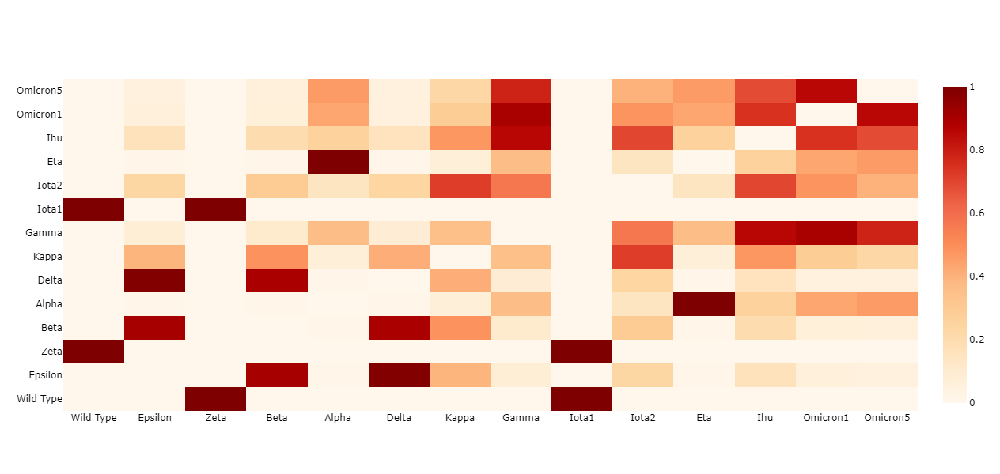

In [ ]:
fig = go.Figure(data=go.Heatmap(
                      z=pvalues_matrix,
                      x=np.arange(0, N),
                      y=np.arange(0, N),
                      colorscale='OrRd'
                    )
                 )
# Edit yaxis
fig.update_layout(yaxis={        'showticklabels': True,
                                  'tickmode': "array",
                                  'tickvals': np.arange(0, N, 1),
                                  'ticktext': labels,
                        })
# Edit xaxis
fig.update_layout(xaxis={

                                'showticklabels': True,
                                'tickmode': "array",
                                'tickvals': np.arange(0, N, 1),
                                'ticktext': labels,


                        })
fig.update_layout(height=height*dpi, width = width*dpi, title_font_color = text_color, font_color = text_color)
fig.write_image("Figures/Centralities/pvalues_kruskal.png", height=height*dpi, width = width*dpi, scale = scale)
fig.show()

In [ ]:
df_k.loc[df_k.index == "Kappa vs Omicron1 Kruskal test"]

,fvalue,pvalue
variant vs variant,,
Kappa vs Omicron1 Kruskal test,19.946462,0.000008


In [ ]:
import pandas as pd
df_k = pd.read_csv("Data\Kruskal_test_eigenvector_centrality.csv", names = ["variant vs variant", "fvalue", "pvalue"], skiprows = 1)
df_k = df_k.set_index("variant vs variant")
df_k

,fvalue,pvalue
variant vs variant,,
Wild Type vs Epsilon Kruskal test,116.201218,4.294382e-27
Wild Type vs Zeta Kruskal test,0.000000,1.000000e+00
Wild Type vs Beta Kruskal test,401.604965,2.463517e-89
Wild Type vs Alpha Kruskal test,246.789407,1.301355e-55
Wild Type vs Delta Kruskal test,395.003688,6.738853e-88
...,...,...
Eta vs Omicron1 Kruskal test,15.196990,9.685768e-05
Eta vs Omicron5 Kruskal test,70.461003,4.694556e-17
Ihu vs Omicron1 Kruskal test,10.298162,1.331628e-03


In [ ]:
names = []
fvalues = []
pvalues = []
for row in enumerate(df_k.iterrows()):
    name = row[1][0]
    fvalue = row[1][1][0]
    pvalue = row[1][1][1]
    names.append(name)
    fvalues.append(float(fvalue))
    pvalues.append(float(pvalue))

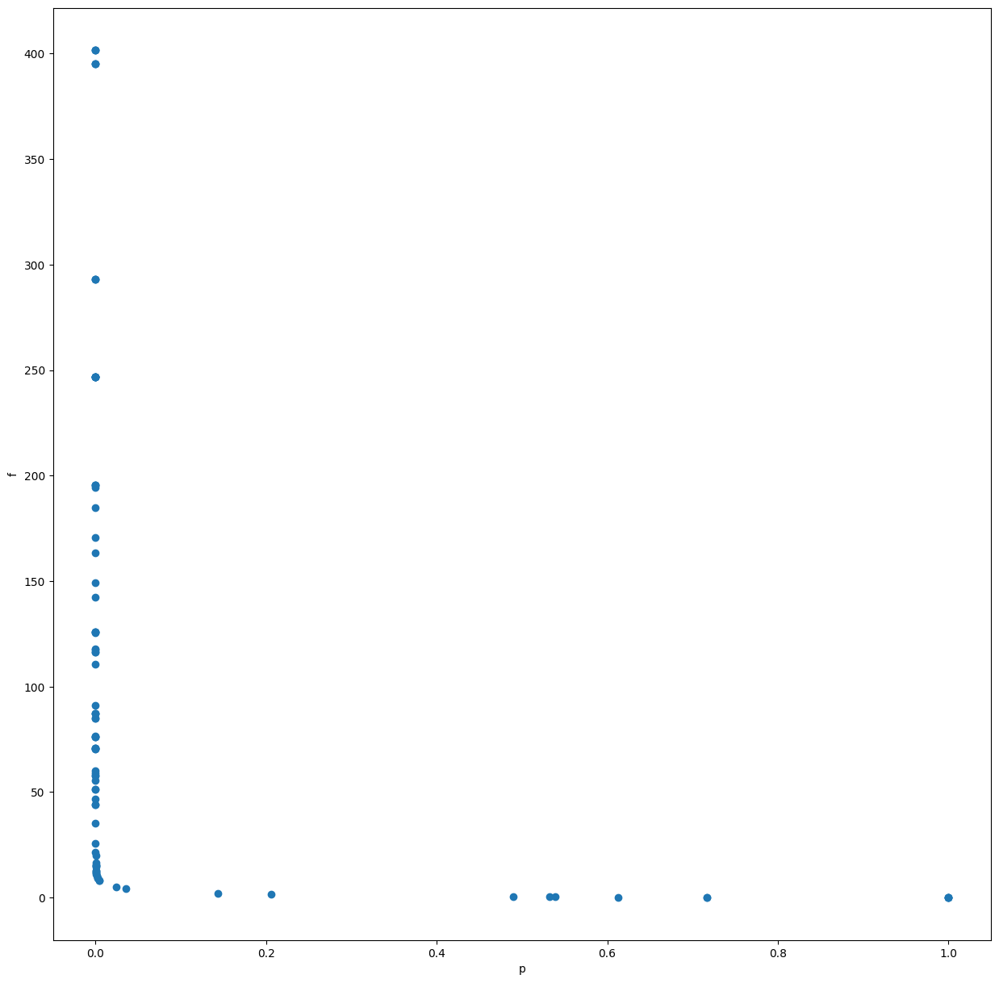

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize = (15, 15))
plt.scatter(pvalues, fvalues)
plt.xlabel("p")
plt.ylabel("f")
plt.show()

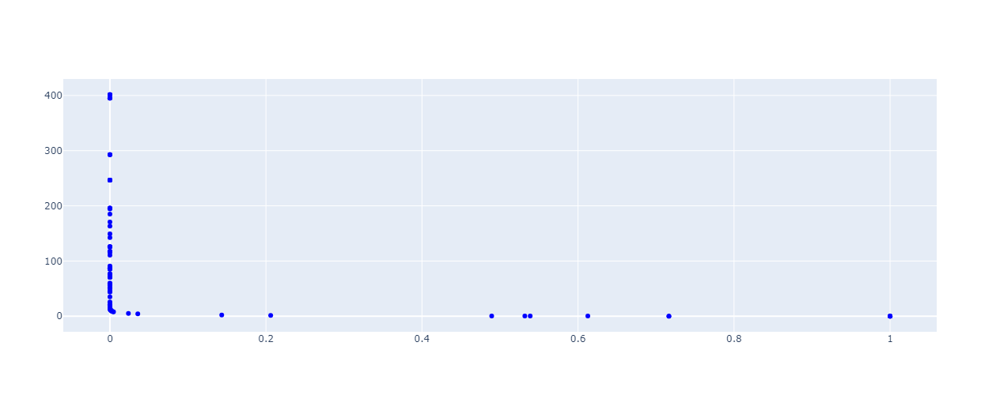

In [ ]:
#do it with plotly
fig = go.Figure()
for i, name in enumerate(names):
    fvalue = [fvalues[i]]
    pvalue = [pvalues[i]]
    fig.add_trace(go.Scatter(x=pvalue,
                         y=fvalue,
                         mode='markers',
                         name = name,
                         marker_color = "blue",
                         showlegend = False,
                         hoverinfo = "name"
        )
    )
fig.update_layout(autosize = False, height = 500, width = 1000)
fig.show()

In [ ]:
labels = []
N = len(list(spike_muts_variants.keys()))
pvalues_matrix = np.zeros((N, N))


for directory, centrality_name in map_centralities_dict_names.items():
    results_a = {}
    for i, (variant1, centrality1) in enumerate(centrality_all.items()):
        if variant1 not in labels:
            labels.append(variant1)
        dict_1 = centrality1[centrality_name]
        dict_1 = {key[3:]: value for key, value in dict_1.items()}
        for j, (variant2, centrality2) in enumerate(centrality_all.items()):
            if variant1 != variant2:
                dict_2 = centrality2[centrality_name]
                dict_2 = {key[3:]: value for key, value in dict_2.items()}
                dict_1, dict_2, idx = remove_unmodelled(dict_1, dict_2)
                values_to_confront = [list(dict_1.values()), list(dict_2.values())]
                fvalue_anova, pvalue_anova = f_oneway(*values_to_confront)
                if "{} vs {} Anova test".format(variant2, variant1) not in results_a.keys():
                    results_a["{} vs {} Anova test".format(variant1, variant2)] = {"fvalue": fvalue_anova, "pvalue": pvalue_anova}
                pvalues_matrix[i][j] = pvalue_anova
                pvalues_matrix[j][i] = pvalue_anova
            else:
                pvalues_matrix[i][j] = 0.0
                pvalues_matrix[j][i] = 0.0
    df_a = pd.DataFrame.from_dict(results_a).T
    df_a.to_csv("Data\Anova_test_{}_centrality.csv".format(centrality_name.split("_")[0]))

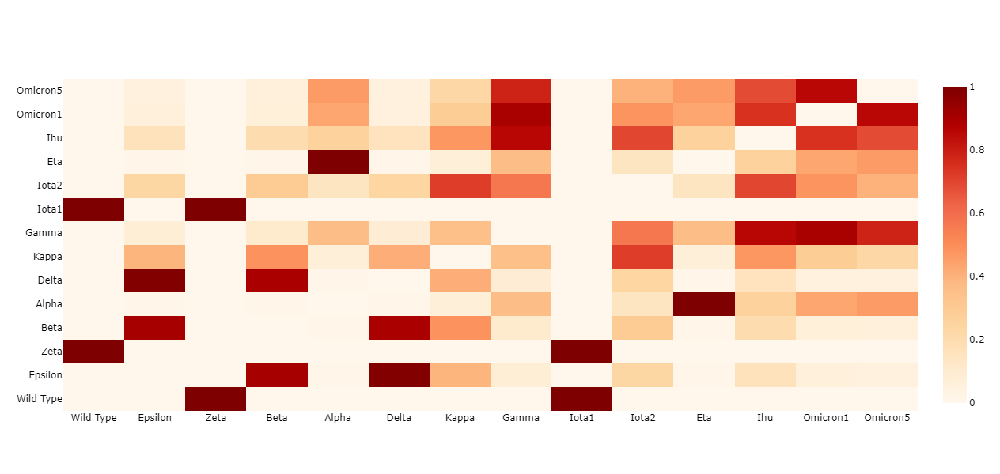

In [ ]:
fig = go.Figure(data=go.Heatmap(
                      z=pvalues_matrix,
                      x=np.arange(0, N),
                      y=np.arange(0, N),
                      colorscale='OrRd'
                    )
                 )
# Edit yaxis
fig.update_layout(yaxis={        'showticklabels': True,
                                  'tickmode': "array",
                                  'tickvals': np.arange(0, N, 1),
                                  'ticktext': labels,
                        })
# Edit xaxis
fig.update_layout(xaxis={

                                'showticklabels': True,
                                'tickmode': "array",
                                'tickvals': np.arange(0, N, 1),
                                'ticktext': labels,


                        })
fig.update_layout(height=height*dpi, width = width*dpi, title_font_color = text_color, font_color = text_color)
fig.write_image("Figures/Centralities/pvalues_anova.png", height=height*dpi, width = width*dpi, scale = scale)
fig.show()

In [ ]:
def readPDBFile(pdbFilePath):
    """
    Read the pdb file.
    Parameters:
        pdbFilePath: string, is the complete PDB file path to read.
    Returns:
        atoms: np.array, contains all the informations contained in the 'ATOM' key of the pdb files.
    """

    atoms = []
    with open(pdbFilePath) as pdbfile:
        for line in pdbfile:
            if line[:4] == 'ATOM':
                #split the line
                splitted_line = [line[:6], line[6:11], line[12:16], line[17:20], line[21], line[22:26], line[30:38], line[38:46], line[46:54], line[56:61], line[62:66]]
                atoms.append(splitted_line)

    return np.array(atoms)

def getResidueCoordinates(atoms):
    """
    Compute the distances between the alpha carbons of the amino acids.
    Parameters:
        atoms: np.array, contains all the informations contained in the 'ATOM' key of the pdb files.
    Returns:
        coordinates: np.array, contains alpha carbon coordinates of the amino acids of the proteins.
    """
    coordinates = []
    residues_list = ['ALA', 'CYS', 'ASP', 'GLU', 'PHE', 'GLY', 'HIS', 'ILE', 'LYS',
                   'LEU', 'MET', 'ASN', 'PRO', 'GLN', 'ARG', 'SER', 'THR', 'VAL',
                   'TRP', 'TYR']

    dropped = []

    last_residue_num = 0

    for i, atom in enumerate(atoms):

        residue_name = atom[3]
        residue_chain = atom[4]
        residue_num = int (atom[5])

        if residue_name in residues_list:

            if (residue_num != last_residue_num):

                if (atom[2].replace(" ","")=="CA"):
                    cord_C = atom[6:9]
                    coordinates.append([residue_name + str (residue_num) + " " + residue_chain, cord_C])
                    last_residue_num = residue_num

        else:
            dropped.append(residue_name)

    return coordinates

def associateResidueName(coordinates):
    """
    Associate the protein residues names to the networkx node ID.
    Parameters:
        coordinates, np.array, contains the list of residues names
    Returns:
        dict_residue_name: dictionary {residue_nxID: residue_name}
    """
    dict_residue_name = dict()
    for i in range(coordinates.shape[0]):
        dict_residue_name[str (i)] = coordinates[i, 0]
    return dict_residue_name

In [ ]:
np.array(coordinates)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (3237, 2) + inhomogeneous part.

In [ ]:
def getModelledResidues(pdbFilePath):

    modelled_residues = []
    atoms = readPDBFile(pdbFilePath)

    last_resi = 0
    for i, atom in enumerate(atoms):

        resn = atom[3] #res name
        resi = int(atom[5]) #res index
        chain = atom[4]

        if resi != last_resi:
            modelled_residues.append((str(resi)+ " " + chain))
            last_resi = resi

    return modelled_residues

def map_Graph(G, residue_names):

    mapping = dict()
    for i, residue_name in enumerate(residue_names):
        mapping[i] = residue_name

    #relabel nodes
    G = nx.relabel_nodes(G, mapping)
    return G

def removeUnmodelledG(G1, G2):

    modelled1 = list(dict(G1.nodes()).keys())
    modelled2 = list(dict(G2.nodes()).keys())

    for node1 in modelled1:
        if node1 not in modelled2:
            G1.remove_node(node1)

    for node2 in modelled2:
        if node2 not in modelled1:
            G2.remove_node(node2)

    return G1, G2

In [ ]:
N = len(list(A_s.keys()))
D = np.zeros((N, N), dtype = float)
for i, (variant1, A1) in enumerate(A_s.items()):

    index = [i for i, var in enumerate(spike_muts_variants.keys()) if var == variant1][0]
    atoms = readPDBFile("Data/PDB/{}.pdb".format(spike_names[index]))
    coordinates = getResidueCoordinates(atoms)
    map_residues1 = associateResidueName(coordinates)
    map_residues1T = {value: key for key, value in map_residues1.items()}

    G_variant1 = nx.from_numpy_matrix(A1)
    pdb1 = spike_names[index]
    modelled_nodes_variant1 = getModelledResidues("Data/PDB/{}.pdb".format(pdb1))

    G_variant1 = map_Graph(G_variant1, modelled_nodes_variant1)
    print("1 ", variant1)
    for j, (variant2, A2) in enumerate(A_s.items()):
        if i > j:
            if variant1 != variant2:
                print("2 ",variant2)
                index = [i for i, var in enumerate(spike_muts_variants.keys()) if var == variant2][0]
                atoms = readPDBFile("Data/PDB/{}.pdb".format(spike_names[index]))
                coordinates = getResidueCoordinates(atoms)
                map_residues2 = associateResidueName(coordinates)
                map_residues2T = {value: key for key, value in map_residues2.items()}
                map_residues1T, map_residues2T, idx = remove_unmodelled(map_residues1T, map_residues2T)

                G_variant2 = nx.from_numpy_matrix(A2)
                pdb2 = spike_names[index]
                modelled_nodes_variant2 = getModelledResidues("Data/PDB/{}.pdb".format(pdb2))
                G_variant2 = map_Graph(G_variant2, modelled_nodes_variant2)
                G_variant1_new, G_variant2_new = removeUnmodelledG(G_variant1, G_variant2)

                A2_copy = np.array(nx.adjacency_matrix(G_variant2_new).todense())
                max_2 = np.linalg.norm([A2_copy, A2_copy])

                A1_copy = np.array(nx.adjacency_matrix(G_variant1_new).todense())
                max_1 = np.linalg.norm([A1_copy, A1_copy])

                max_ = max(max_1, max_2)
                norm = np.linalg.norm([A1_copy, A2_copy])/max_
            else:
                norm = 1

            D[i, j] = norm
            D[j, i] = norm

        elif i == j :
            D[i, j] = 1

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (3237, 2) + inhomogeneous part.

In [ ]:
np.linalg.norm([A2_copy, A2_copy])/max_

NameError: name 'A2_copy' is not defined

In [ ]:
labels = list(A_s.keys())
fig = go.Figure(data=go.Heatmap(
                      z=D,
                      x=np.arange(0, N),
                      y=np.arange(0, N),
                      colorscale='OrRd'
                    )
                 )
# Edit yaxis
fig.update_layout(yaxis={        'showticklabels': True,
                                  'tickmode': "array",
                                  'tickvals': np.arange(0, N, 1),
                                  'ticktext': labels,
                        })
# Edit xaxis
fig.update_layout(xaxis={

                                'showticklabels': True,
                                'tickmode': "array",
                                'tickvals': np.arange(0, N, 1),
                                'ticktext': labels,


                        })
fig.update_layout(height=800)
fig.show()

In [ ]:
import pandas as pd
pd.set_option("display.precision", 8)
df_D = pd.DataFrame(D, columns = labels, index = labels)
df_D

In [ ]:
df_D.to_csv("Data\PCN_Forbenius_distance.csv")


In [ ]:

#plot contact sim
import plotly.figure_factory as ff
from scipy.spatial.distance import pdist, squareform

ticksuffix = "                             "
# Initialize figure by creating upper dendrogram
labels = np.array(sorted(list(spike_muts_variants.keys())))
n = labels.shape[0]

fig = ff.create_dendrogram(D, orientation='bottom', labels=labels)
for i in range(len(fig['data'])):
    fig['data'][i]['yaxis'] = 'y2'

# Create Side Dendrogram
dendro_side = ff.create_dendrogram(D, orientation='right')
for i in range(len(dendro_side['data'])):
    dendro_side['data'][i]['xaxis'] = 'x2'

# Add Side Dendrogram Data to Figure
for data in dendro_side['data']:
    fig.add_trace(data)

# Create Heatmap
dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
dendro_leaves = list(map(int, dendro_leaves))
data_dist = [1-D[i, j] for i in range(D.shape[0]) for j in range(D.shape[1]) if i > j]#pdist(D)
#print(len(data_dist), len(pdist(D)))
#heat_data = squareform(data_dist)
heat_data = D
heat_data = heat_data[dendro_leaves,:]
heat_data = heat_data[:,dendro_leaves]

# Create Heatmap
dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
dendro_leaves = list(map(int, dendro_leaves))
data_dist = [1-D[i, j] for i in range(D.shape[0]) for j in range(D.shape[1]) if i > j] #pdist(D)

#heat_data = squareform(data_dist)
heat_data = D
heat_data = heat_data[dendro_leaves,:]
heat_data = heat_data[:,dendro_leaves]

heatmap = [
    go.Heatmap(
        x = dendro_leaves,
        y = dendro_leaves,
        z = heat_data,
        colorscale = 'Blues'
    )
]

heatmap[0]['x'] = fig['layout']['xaxis']['tickvals']
heatmap[0]['y'] = dendro_side['layout']['yaxis']['tickvals']

# Add Heatmap Data to Figure
for data in heatmap:
    fig.add_trace(data)

# Edit Layout
fig.update_layout({'width':800, 'height':800,
                         'showlegend':False, 'hovermode': 'closest',
                         })
# Edit xaxis
fig.update_layout(xaxis={'domain': [.15, 1],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'ticks':""})
# Edit xaxis2
fig.update_layout(xaxis2={'domain': [0, .15],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Edit yaxis
fig.update_layout(yaxis={'domain': [0, .85],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'showticklabels': True,
                                  'tickmode': "array",
                                  'tickvals': np.arange(5, 215, 10),
                                  'ticktext': fig['layout']['xaxis']['ticktext']+ticksuffix,
                        })
# Edit yaxis2
fig.update_layout(yaxis2={'domain':[.825, .975],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks': ""})

# Plot!
fig.show()
fig.write_image("Figures\ContactSimilarity\ForbDistance.png")
fig.write_html("Figures\ContactSimilarity\ForbDistance.html")

In [ ]:
#https://matplotlib.org/stable/gallery/specialty_plots/radar_chart.html
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D


def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels, fontsize=16)

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

In [ ]:
all_muts = []
for muts in spike_muts_variants.values():
    for mut in muts:
        if mut not in all_muts:
            all_muts.append(mut)
all_muts = sorted(all_muts)
all_muts = {domain: [mut for mut in all_muts if mut in residues_domains] for domain, residues_domains in domains.items()}

all_variants = list(spike_muts_variants.keys())
temp = [all_variants[0]]
[temp.append(variant) for variant in all_variants[::-1][:-1]]
all_variants = temp
temp = {variant: spike_muts_variants[variant] for variant in all_variants}
spike_muts_variants = temp
spike_muts_variants

{'Wild Type': array([], dtype=float64),
 'Omicron5': array([142, 213, 339, 371, 373, 375, 376, 405, 408, 417, 440, 452, 477,
        478, 484, 486, 498, 501, 505, 614, 655, 679, 681, 764, 796, 954,
        969]),
 'Omicron1': array([ 67,  95, 142, 212, 339, 371, 373, 375, 417, 440, 446, 477, 478,
        484, 493, 496, 498, 501, 505, 547, 614, 655, 679, 681, 764, 796,
        856, 954, 969, 981]),
 'Ihu': array([  96,  190,  210,  346,  394,  449,  490,  501,  614,  681,  859,
         936, 1191]),
 'Eta': array([ 52,  67, 484, 614, 677, 888]),
 'Iota2': array([  5,  95, 253, 484, 614]),
 'Iota1': array([  5,  95, 253, 477, 614]),
 'Gamma': array([ 138,  190,  417,  484,  501,  614,  655, 1027]),
 'Kappa': array([ 154,  484,  614,  681, 1071]),
 'Delta': array([158, 452, 478, 614, 681, 950]),
 'Alpha': array([ 501,  570,  614,  681,  716,  982, 1118]),
 'Beta': array([ 80, 215, 246, 417, 484, 501, 614, 701]),
 'Zeta': array([ 484,  614, 1176]),
 'Epsilon': array([ 13, 152, 452, 614])}

In [ ]:
centrality_all_no_resname = {variant: {centrality_name: {residue[3:]: value for residue, value in residues.items()} for centrality_name, residues in centrality_variant.items()} for variant, centrality_variant in centrality_all.items()}
betweenness_data = {}
eigenvector_data = {}
closeness_data = {}
degree_data = {}
katz_data = {}
j = 0
chains = ["A", "B", "C"]

wt_centralities = centrality_all_no_resname["Wild Type"]

for domain, muts in all_muts.items():

    betweenness_data[domain] = np.zeros((len(all_variants), len(muts)))
    eigenvector_data[domain] = np.zeros((len(all_variants), len(muts)))
    closeness_data[domain] = np.zeros((len(all_variants), len(muts)))
    degree_data[domain] = np.zeros((len(all_variants), len(muts)))
    katz_data[domain] = np.zeros((len(all_variants), len(muts)))

    for i, (variant, centrality_variant) in enumerate(centrality_all_no_resname.items()):
        #print(variant, i)
        for centrality_name, centrality_residues in centrality_variant.items():
            for resi in muts:
            #if int(residue.split()[0]) in spike_muts_variants[variant]:
                to_mean = []
                for chain in chains:
                    if str(resi)+" "+chain in centrality_residues.keys():
                        to_mean.append(centrality_residues[str(resi)+" "+chain])
                    else:
                        if str(resi)+" "+chain in wt_centralities[centrality_name].keys():
                            to_mean.append(wt_centralities[centrality_name][str(resi)+" "+chain])
                if len(to_mean) == 0:
                    to_mean.append(0.0)
                j = int(np.argwhere(np.array(muts) == resi)[0])
                mean = np.mean(to_mean)
                if centrality_name == "eigenvector_c":
                        #print(variant, i, j)
                    eigenvector_data[domain][i][j] = mean
                elif centrality_name == "betweenness":
                    betweenness_data[domain][i][j] = mean
                elif centrality_name == "degree_c":
                    degree_data[domain][i][j] = mean
                elif centrality_name == "closeness":
                    closeness_data[domain][i][j] = mean
                elif centrality_name == "katz_c":
                    katz_data[domain][i][j] = mean

NTD
52 - 96
138 - 158
190 - 215
246 - 253
CT0
RBD
339 - 375
376 - 417
440 - 477
478 - 493
496 - 505
CT1
CT2
S2S2'
FP
FPR
HR1
CH
CD
CD1


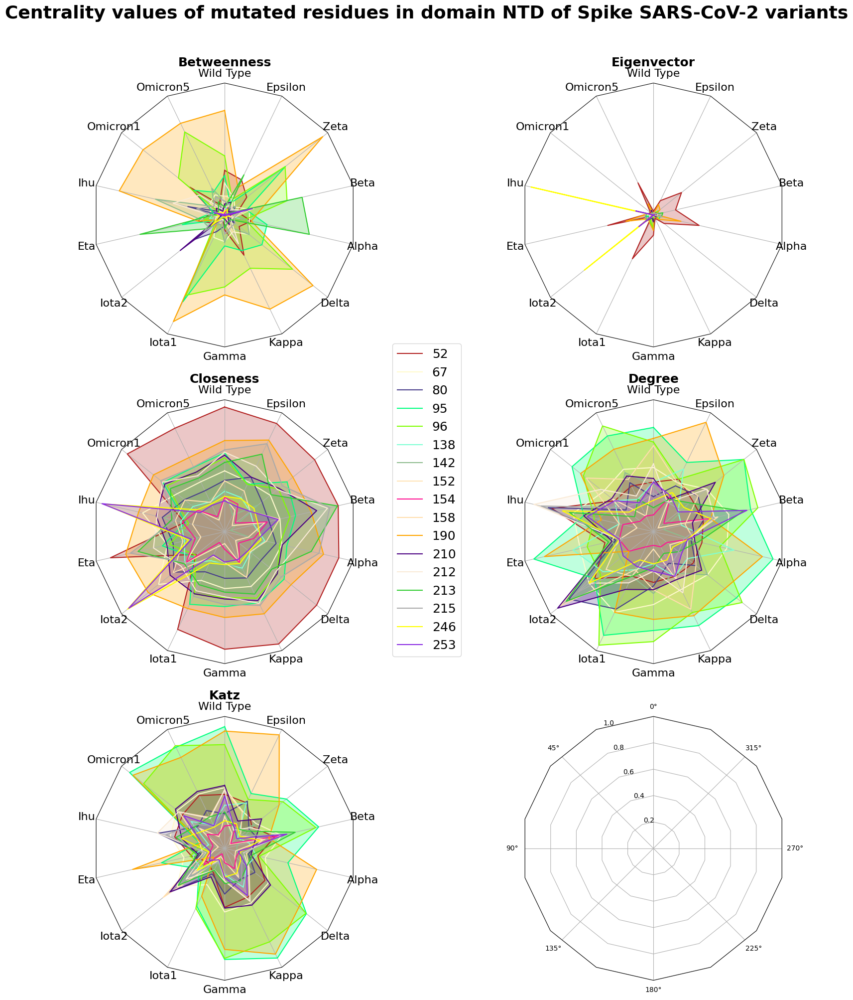

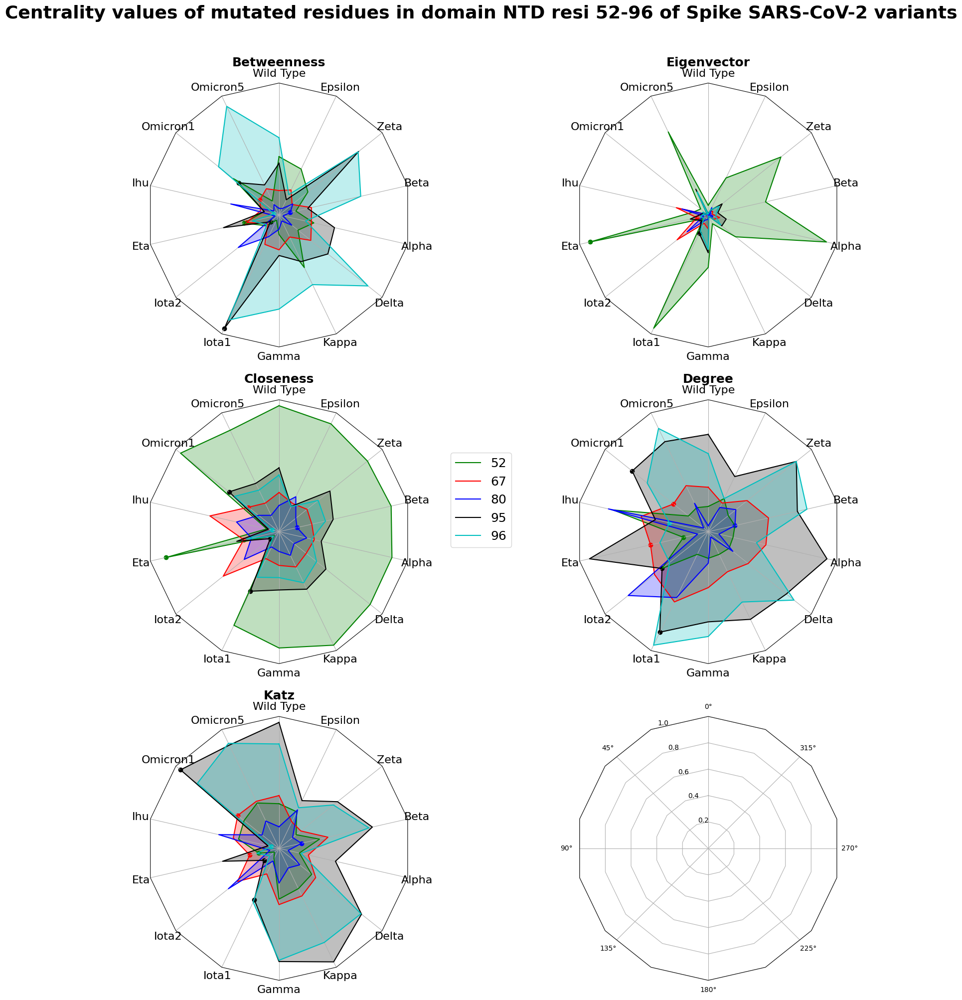

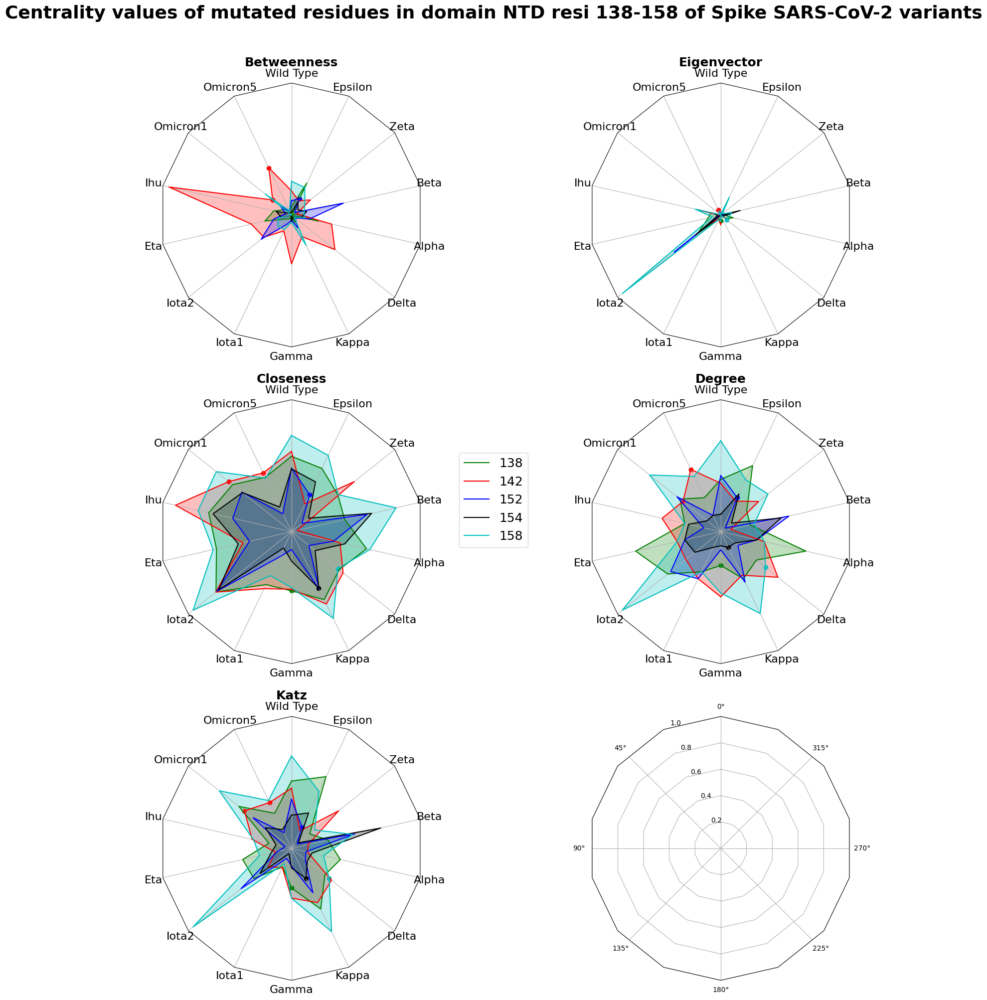

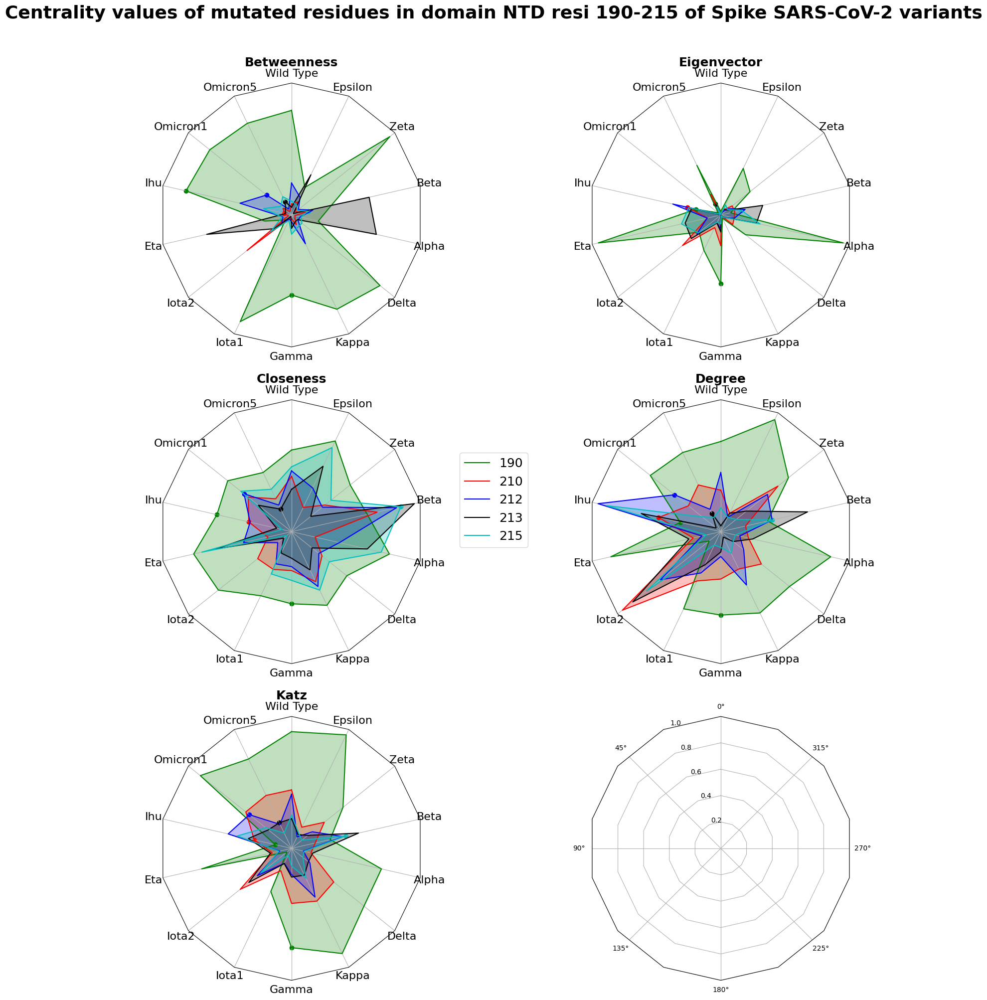

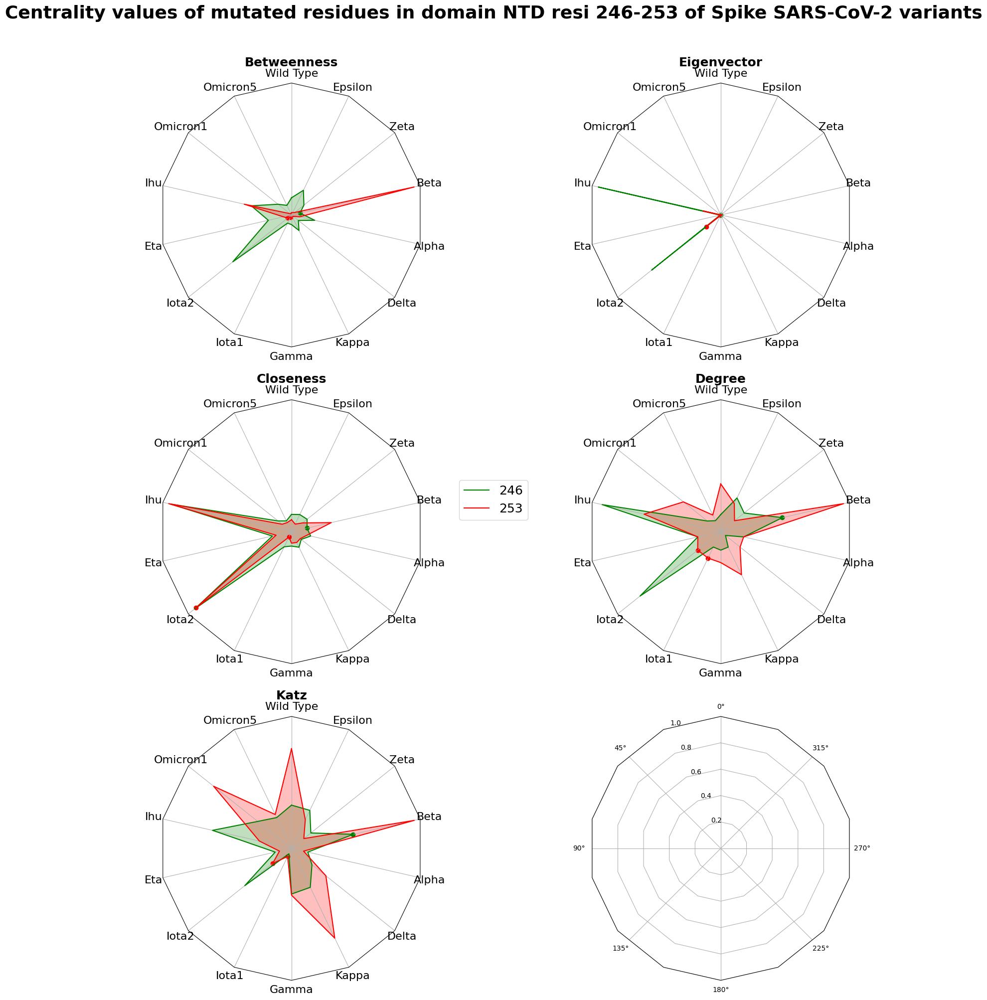

...

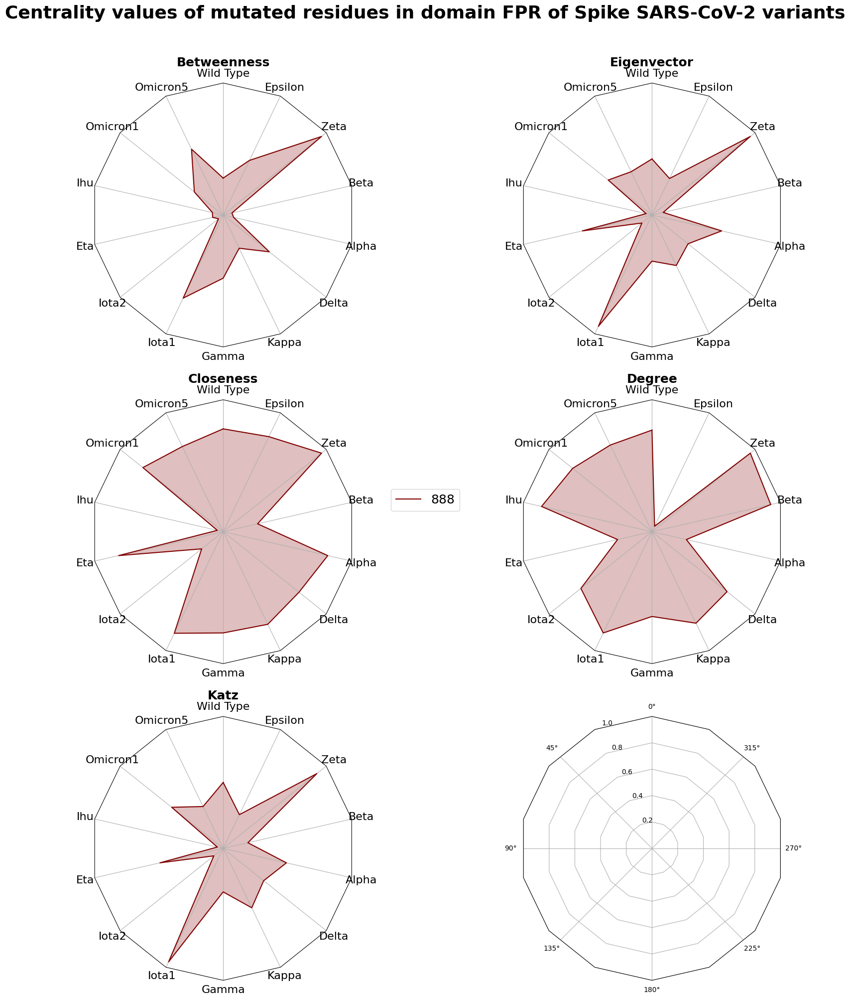

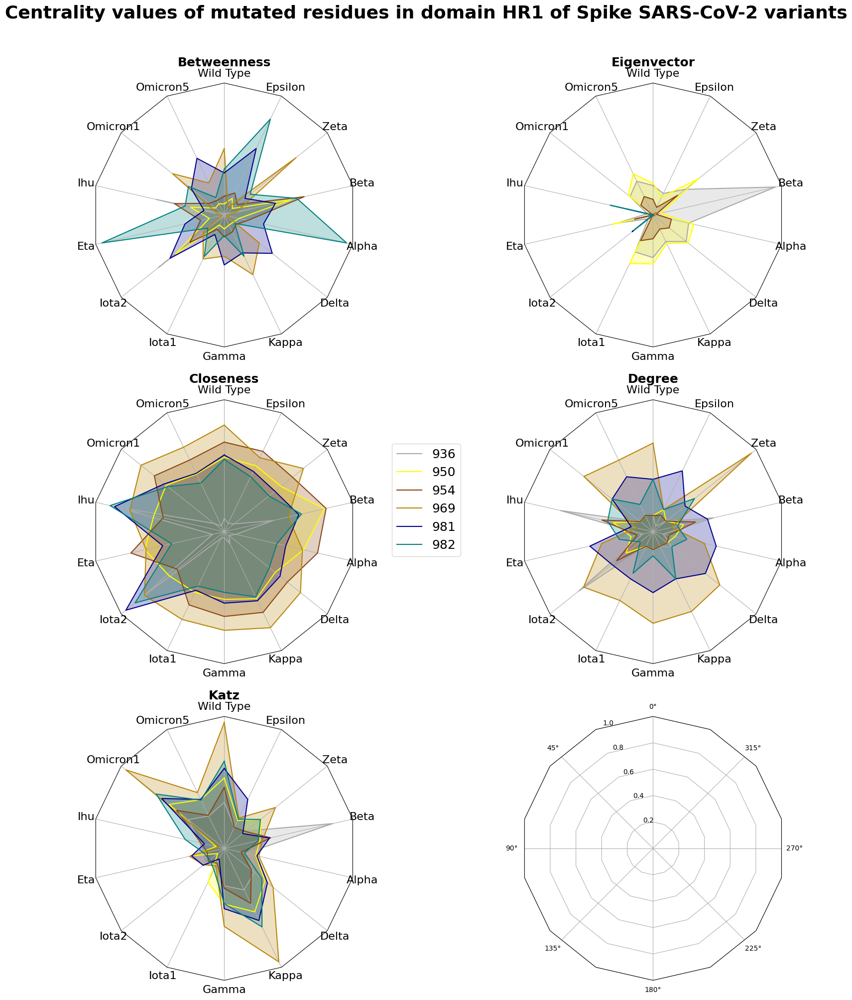

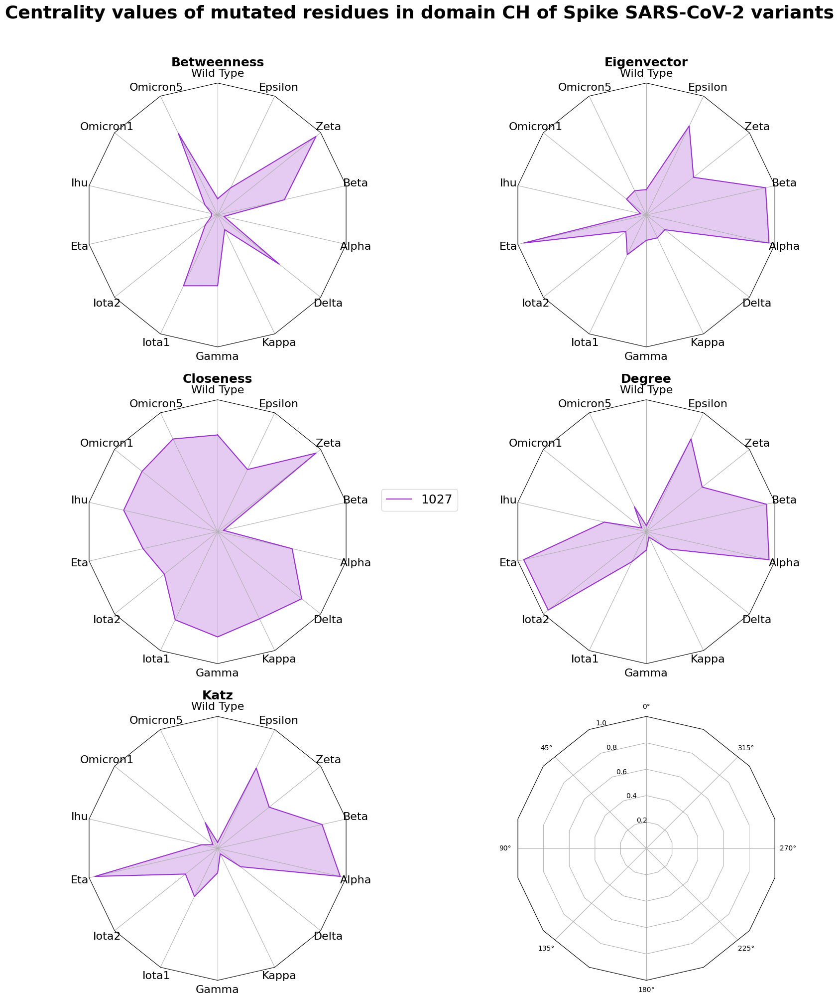

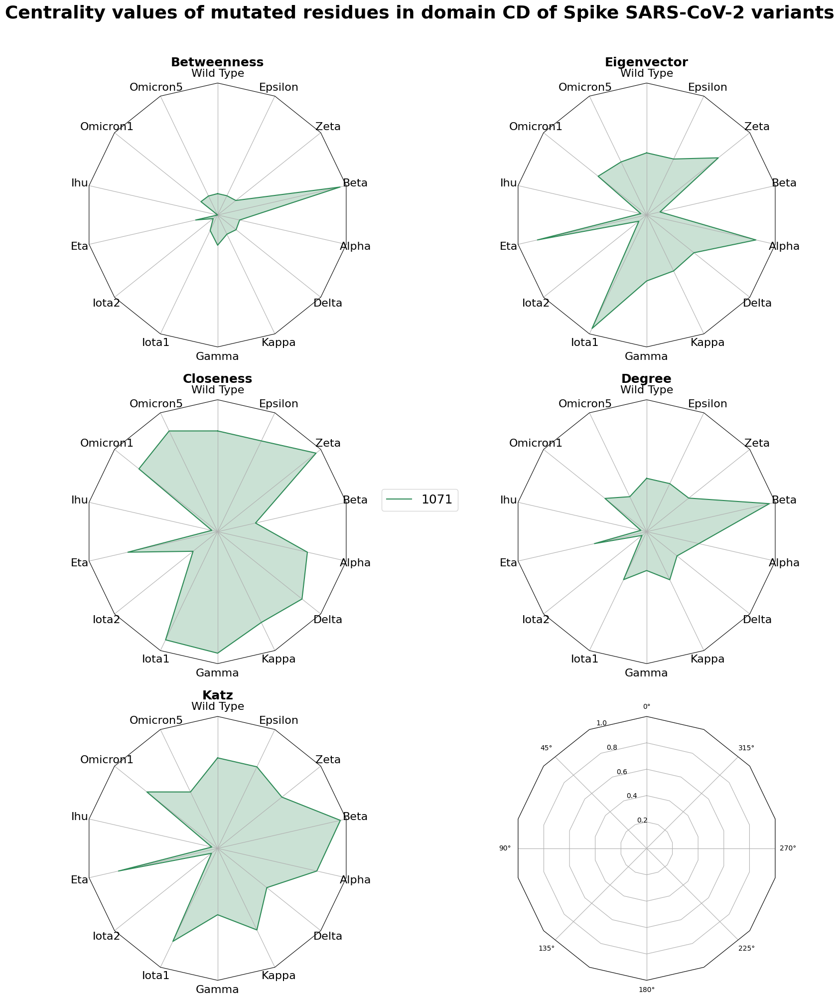

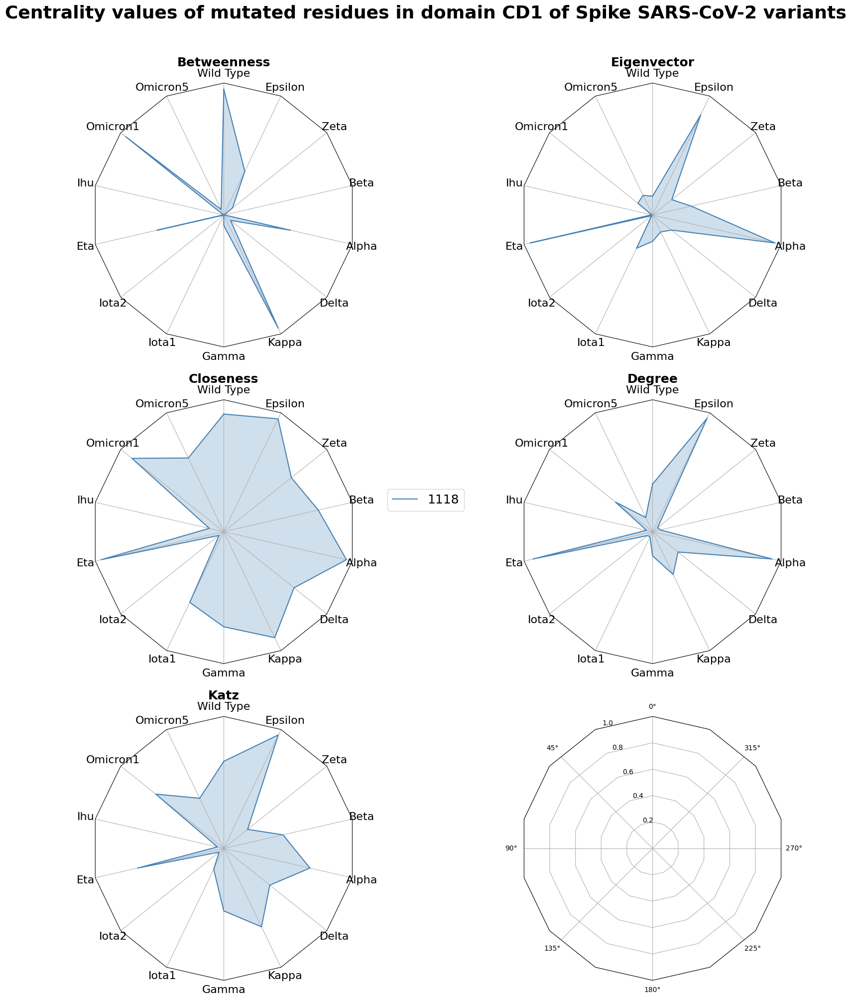

In [ ]:
import matplotlib.colors as mcolors
from random import sample

for domain, muts in all_muts.items():
    print(domain)
    if len(muts) > 0:

        labels = muts
        N = len(all_variants)
        k = len(labels)
        theta = radar_factory(N, frame='polygon')
        data = [
            all_variants,
            ("Betweenness", [list(data) for data in betweenness_data[domain].T]),
            ("Eigenvector", [list(data) for data in eigenvector_data[domain].T]),
            ("Closeness", [list(data) for data in closeness_data[domain].T]),
            ("Degree", [list(data) for data in degree_data[domain].T]),
            ("Katz", [list(data) for data in katz_data[domain].T])
        ]

        spoke_labels = data.pop(0)

        colors = list((mcolors.CSS4_COLORS).keys())
        colors.remove("white")

        fig, axs = plt.subplots(figsize=(20, 20), nrows=3, ncols=2, subplot_kw=dict(projection='radar'))
        fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.90, bottom=0.00)

        colors = sample(colors, k)

        # Plot the four cases from the example data on separate axes
        for ax, (title, case_data) in zip(axs.flat, data):
            ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
            ax.set_title(title, weight='bold', size=18, position=(0.5, 1.1),
                         horizontalalignment='center', verticalalignment='center')
            for d, color in zip(case_data, colors):
                ax.plot(theta, d, color=color)
                ax.fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
            ax.set_varlabels(spoke_labels)

            # add legend relative to top-left plot
            #legend = axs[0, 0].legend(labels, loc=(0.5, 0.8),
            #                          labelspacing=0.1, fontsize='small')

        fig.text(0.5, 0.965, 'Centrality values of mutated residues in domain {} of Spike SARS-CoV-2 variants'.format(domain),
                     horizontalalignment='center', color='black', weight='bold',
                     size=26)

        fig.legend(labels, loc = 'center', ncol=1, labelspacing=0.5, prop={'size': 18})

        #plt.show()
        plt.savefig("Figures\Radar\mutations_radar_{}.png".format(domain), dpi=600, facecolor="white", transparent=False)

        if len(muts) > 6:
            n = len(muts)
            m = 5
            new_muts = [muts[i:i+m] for i in range(0,n,m)]
            for nmuts in new_muts:
                start = nmuts[0]
                end = nmuts[-1]
                idx_start = np.argwhere(muts == start)[0][0]
                idx_end = np.argwhere(muts == end)[0][0]+1#works
                #print(idx_start)
                print(start, "-", end)
                labels = nmuts
                N = len(all_variants)
                k = len(labels)
                theta = radar_factory(N, frame='polygon')
                data = [
                    all_variants,
                    ("Betweenness", [list(data) for data in betweenness_data[domain].T[idx_start:idx_end]]),
                    ("Eigenvector", [list(data) for data in eigenvector_data[domain].T[idx_start:idx_end]]),
                    ("Closeness", [list(data) for data in closeness_data[domain].T[idx_start:idx_end]]),
                    ("Degree", [list(data) for data in degree_data[domain].T[idx_start:idx_end]]),
                    ("Katz", [list(data) for data in katz_data[domain].T[idx_start:idx_end]])
                ]

                spoke_labels = data.pop(0)


                fig, axs = plt.subplots(figsize=(20, 20), nrows=3, ncols=2, subplot_kw=dict(projection='radar'))
                fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.90, bottom=0.0)

                ncolors = ["g", "r", "b", "k", "c"]

                # Plot the four cases from the example data on separate axes
                for ax, (title, case_data) in zip(axs.flat, data):
                    ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
                    ax.set_title(title, weight='bold', position=(0.5, 1.1), size = 18,
                                 horizontalalignment='center', verticalalignment='center')
                    for d, ncolor in zip(case_data, ncolors):
                        ax.plot(theta, d, color=ncolor)
                        ax.fill(theta, d, facecolor=ncolor, alpha=0.25, label='_nolegend_')

                        #done_muts = []
                    for idx, (variant, smuts) in enumerate(spike_muts_variants.items()):
                        for jdx, mut in enumerate(nmuts):
                            d = case_data[jdx]
                            if mut in smuts:
                                #print(title, variant, ncolor, nmuts, mut)
                                #print(mut, "in variant ", variant)
                                #print(theta[idx], d[idx], ncolors[jdx])
                                #if mut not in done_muts:
                                #print(d, idx, d[idx], jdx, d[jdx])
                                ax.scatter(theta[idx], d[idx], color=ncolors[jdx], label='_nolegend_')
                                #done_muts.append(mut)

                        ax.set_varlabels(spoke_labels)

                    # add legend relative to top-left plot
                    #legend = axs[0, 0].legend(labels, loc=(0.5, 0.8),
                    #                          labelspacing=0.1, fontsize='small')

                fig.text(0.5, 0.965, 'Centrality values of mutated residues in domain {} resi {}-{} of Spike SARS-CoV-2 variants'.format(domain, start, end),
                             horizontalalignment='center', color='black', weight='bold',
                             size=26)

                fig.legend(labels, loc = 'center', ncol=1, labelspacing=0.5, prop={'size': 18})

                #plt.show()
                plt.savefig("Figures\Radar\mutations_radar_{}_resi{}_{}.png".format(domain, start, end), dpi=600, facecolor="white", transparent=False)
                #plt.clf()

In [ ]:
def global_metric(cc_variant, ec_variant, dc_variant, kz_variant, bc_variant, cc_wt, ec_wt, dc_wt, kz_wt, bc_wt, tm_score):

    mean_cc_v = np.mean(cc_variant)
    mean_dc_v = np.mean(dc_variant)
    mean_kc_v = np.mean(kc_variant)
    mean_ec_v = np.mean(ec_variant)
    mean_bc_v = np.mean(bc_variant)

    mean_cc_wt = np.mean(cc_wt)
    mean_dc_wt = np.mean(dc_wt)
    mean_kc_wt = np.mean(kc_wt)
    mean_ec_wt = np.mean(ec_wt)
    mean_bc_wt = np.mean(bc_wt)

    log = np.log(mean_ec_v/mean_ec_wt) + np.log(mean_bc_v/mean_bc_wt) + np.log(mean_dc_v/mean_dc_wt) + np.log(mean_kc_v/mean_kc_wt) + np.log(mean_cc_v/mean_cc_wt)
    total = log + tm_score
    return total

In [ ]:
import numpy as np
import PIL
from PIL import Image

directories = {"Figures\\boxplot\\KC_box\\": "katz_c",
               "Figures\\boxplot\\EC_box\\": "eigenvector_c",
               "Figures\\boxplot\\DC_box\\": "degree_c",
               "Figures\\boxplot\\BC_box\\": "betweenness",
               "Figures\\boxplot\\CC_box\\": "closeness"
              }
for directory, centrality in directories.items():
    list_im = [directory+'boxplot_{}.png'.format(centrality), directory+'boxplot_{}_domains_Omicron1.png'.format(centrality), directory+'boxplot_{}_RBD.png'.format(centrality)]
    imgs    = [ Image.open(i) for i in list_im ]
    # pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
    min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
    # for a vertical stacking it is simple: use vstack
    imgs_comb = np.vstack([i.resize(min_shape) for i in imgs])
    imgs_comb = Image.fromarray( imgs_comb)
    imgs_comb.save( 'Fig3_{}.png'.format(centrality))